# Wasserstein GAN with Gradient Penalty
## For generation of features based on LHCO2020 datasets

In [3]:
import h5py as h5
import numpy as np
from math import ceil, floor, isnan
import random
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras import layers
import keras.backend as K
import gc
print(tf.__version__)
physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)
print(physical_devices[0])

tf.random.set_seed(1234)

2.1.0
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [4]:
filenames = {
    "herwig": "GAN-data\events_anomalydetection_DelphesHerwig_qcd_features.h5",
    "pythiabg": "GAN-data\events_anomalydetection_DelphesPythia8_v2_qcd_features.h5",
    "pythiasig": "GAN-data\events_anomalydetection_DelphesPythia8_v2_Wprime_features.h5"
}

datatypes = ["herwig", "pythiabg", "pythiasig"]
features = ["px", "py", "pz", "m", "tau1", "tau2", "tau3"]

train_features = ["mj2", "mjdelta", "tau21j1", "tau21j2"] # Can be flexibly changed to suit GAN needs

In [5]:
def load_data(datatype, stop = None):
    input_frame = pd.read_hdf(filenames[datatype], stop = stop)
    output_frame = input_frame.copy()
    for feature in features:
        output_frame[feature + "j1"] = (input_frame["mj1"] >= input_frame["mj2"])*input_frame[feature + "j1"] + (input_frame["mj1"] < input_frame["mj2"])*input_frame[feature + "j2"]
        output_frame[feature + "j2"] = (input_frame["mj1"] >= input_frame["mj2"])*input_frame[feature + "j2"] + (input_frame["mj1"] < input_frame["mj2"])*input_frame[feature + "j1"]
    del input_frame
    gc.collect()
    output_frame["mjdelta"] = output_frame["mj1"] - output_frame["mj2"]
    output_frame["ej1"] = np.sqrt(output_frame["mj1"]**2 + output_frame["pxj1"]**2 + output_frame["pyj1"]**2 + output_frame["pzj1"]**2)
    output_frame["ej2"] = np.sqrt(output_frame["mj2"]**2 + output_frame["pxj2"]**2 + output_frame["pyj2"]**2 + output_frame["pzj2"]**2)
    output_frame["ejj"] = output_frame["ej1"] + output_frame["ej2"]
    output_frame["pjj"] = np.sqrt((output_frame["pxj1"] + output_frame["pxj2"])**2 + (output_frame["pyj1"] + output_frame["pyj2"])**2 + (output_frame["pyj1"] + output_frame["pyj2"])**2)
    output_frame["mjj"] = np.sqrt(output_frame["ejj"]**2 - output_frame["pjj"]**2)
    output_frame["tau21j1"] = output_frame["tau2j1"] / output_frame["tau1j1"]
    output_frame["tau32j1"] = output_frame["tau3j1"] / output_frame["tau2j1"]
    output_frame["tau21j2"] = output_frame["tau2j2"] / output_frame["tau1j2"]
    output_frame["tau32j2"] = output_frame["tau3j2"] / output_frame["tau2j2"]
    return output_frame

In [6]:
# Network hyperparameters

BATCH_SIZE = 256
EPOCHS = 1000
LEARNING_RATE_GEN = 1e-5
LEARNING_RATE_DISC = 1e-5
N_CRITIC = 5
C_LAMBDA = 10

In [8]:
df = load_data("herwig")

# Ensures all batches have same size

df.dropna(inplace = True)
df.drop([i for i in range(df.shape[0] % (BATCH_SIZE * 4))], inplace = True)
df.reset_index(drop = True, inplace = True)
df = df.astype('float32')

In [9]:
# Normalize all inputs between -1 and 1

scaler = MinMaxScaler((-1,1)).fit(df[train_features])
feature_df = scaler.transform(df[train_features])

X_train, X_test = train_test_split(feature_df, test_size = 0.25, random_state = 1234)
len_dataset = int(X_train.shape[0] / BATCH_SIZE)
len_testset = int(X_test.shape[0] / BATCH_SIZE)
print("Dataset consists of {} batches of {} samples each, total {} samples".format(len_dataset, BATCH_SIZE, len_dataset * BATCH_SIZE))
print("Testset consists of {} batches of {} samples each, total {} samples".format(len_testset, BATCH_SIZE, len_testset * BATCH_SIZE))

del df
gc.collect()

Dataset consists of 2928 batches of 256 samples each, total 749568 samples
Testset consists of 976 batches of 256 samples each, total 249856 samples


0

In [10]:
train_dataset = tf.data.Dataset.from_tensor_slices(np.array(X_train)).batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.from_tensor_slices(np.array(X_test)).batch(BATCH_SIZE)

In [11]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(50, input_shape=(len(train_features),)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(50))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(50))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    model.add(layers.Dense(len(train_features), activation='tanh'))
    assert model.output_shape == (None, len(train_features))

    return model

In [12]:
generator = make_generator_model()

In [13]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(50, input_shape=(len(train_features),)))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(50))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Dense(1)) # WGAN: No sigmoid activation in last layer

    return model

In [14]:
discriminator = make_discriminator_model()

In [15]:
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 50)                250       
_________________________________________________________________
batch_normalization (BatchNo (None, 50)                200       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 50)                0         
_________________________________________________________________
dropout (Dropout)            (None, 50)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 50)                2550      
_________________________________________________________________
batch_normalization_1 (Batch (None, 50)                200       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 50)                0

In [16]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 50)                250       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 50)                2550      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 50)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                

In [17]:
@tf.function
def gradient_penalty(real, fake, epsilon): 
    # mixed_images = real * epsilon + fake * (1 - epsilon)
    mixed_images = fake + epsilon * (real - fake)
    with tf.GradientTape() as tape:
        tape.watch(mixed_images) 
        mixed_scores = discriminator(mixed_images)
        
    gradient = tape.gradient(mixed_scores, mixed_images)[0]
    
    gradient_norm = tf.norm(gradient)
    penalty = tf.math.reduce_mean((gradient_norm - 1)**2)
    return penalty

In [18]:
@tf.function
def discriminator_loss(real_output, fake_output, gradient_penalty):
    loss = tf.math.reduce_mean(fake_output) - tf.math.reduce_mean(real_output) + C_LAMBDA * gradient_penalty
    return loss

In [19]:
@tf.function
def generator_loss(fake_output):
    gen_loss = -1. * tf.math.reduce_mean(fake_output)
    return gen_loss

In [20]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE_GEN)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE_DISC)

In [21]:
# Convert tensor to float for loss function plotting
def K_eval(x):
    try:
        return K.get_value(K.to_dense(x))
    except:
        eval_fn = K.function([], [x])
        return eval_fn([])[0]

In [22]:
@tf.function
def train_step_generator():
  noise = tf.random.normal([BATCH_SIZE, len(train_features)])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)
    fake_output = discriminator(generated_images, training=True)
    gen_loss = generator_loss(fake_output)

  gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)

  generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
  
  return gen_loss

In [23]:
@tf.function
def train_step_discriminator(images):
  noise = tf.random.normal([BATCH_SIZE, len(train_features)])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    epsilon = tf.random.normal([BATCH_SIZE,len(train_features)])
    gp = gradient_penalty(images, generated_images, epsilon)
    
    disc_loss = discriminator_loss(real_output, fake_output, gp)

  gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  
  return disc_loss

In [24]:
@tf.function
def evaluate_generator():
    noise = tf.random.normal([BATCH_SIZE, len(train_features)])
    generated_images = generator(noise, training=False)

    fake_output = discriminator(generated_images, training=False)

    gen_loss = generator_loss(fake_output)

    return gen_loss

In [25]:
@tf.function
def evaluate_discriminator(images):
    noise = tf.random.normal([BATCH_SIZE, len(train_features)])
    generated_images = generator(noise, training=False)

    real_output = discriminator(images, training=False)
    fake_output = discriminator(generated_images, training=False)

    epsilon = tf.random.normal([BATCH_SIZE,len(train_features)])
    gp = gradient_penalty(images, generated_images, epsilon)
    
    disc_loss = discriminator_loss(real_output, fake_output, gp)

    return disc_loss

In [26]:
def graph_gan(generator):
    realdata = scaler.inverse_transform(X_train)
    fakedata = scaler.inverse_transform(generator(tf.random.normal((10000, len(train_features))), training=False))
    
    plt.title("Subleading Jet Mass")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$m_{J_2}$")
    plt.hist(realdata[:,0], bins = 25, range = (0, 600), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,0], bins = 25, range = (0, 600), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

    plt.title("Leading-Subleading Jet Mass Delta")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$m_{J_1}-m_{J_2}$")
    plt.hist(realdata[:,1], bins = 25, range = (0, 600), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,1], bins = 25, range = (0, 600), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

    plt.title("N-subjettiness ratio")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$\\tau_{21J_1}$")
    plt.hist(realdata[:,2], bins = 25, range = (0, 1), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,2], bins = 25, range = (0, 1), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()
    
    plt.title("N-subjettiness ratio")
    plt.ylabel("Normalized to Unity")
    plt.xlabel("$\\tau_{21J_2}$")
    plt.hist(realdata[:,3], bins = 25, range = (0, 1), color = "tab:orange", alpha = 0.5, label = "Herwig Background", density = True)
    plt.hist(fakedata[:,3], bins = 25, range = (0, 1), color = "tab:blue", histtype = "step", label = "GAN", density = True)
    plt.legend()
    plt.show()

In [27]:
train_gen_losses = []
train_disc_losses = []
test_gen_losses = []
test_disc_losses = []

In [28]:
def graph_genloss():
    plt.title("Generator Loss")
    plt.ylabel("Wasserstein Loss")
    plt.xlabel("Epoch")
    plt.plot(train_gen_losses, 'b', label = "Training loss")
    plt.plot(test_gen_losses, 'r', label = "Validation loss")
    plt.legend()
    plt.show()

In [29]:
def graph_discloss():
    plt.title("Discriminator Loss")
    plt.ylabel("Wasserstein Loss")
    plt.xlabel("Epoch")
    plt.plot(train_disc_losses, 'b', label = "Training loss")
    plt.plot(test_disc_losses, 'r', label = "Validation loss")
    plt.legend()
    plt.show()

In [30]:
def train(dataset, testset, epochs, n_critic):
  for epoch in tqdm(range(epochs)):
    print_losses = ((epoch + 1) % 10 == 0)
    draw_outputs = ((epoch + 1) % 20 == 0)

    train_gen_loss = 0
    train_disc_loss = 0

    test_gen_loss = 0
    test_disc_loss = 0

    # Training

    for batchnum, image_batch in enumerate(dataset):
      if random.random() < 1 / n_critic:
        train_gen_loss += K_eval(train_step_generator()) / len_dataset * n_critic
      train_disc_loss += K_eval(train_step_discriminator(image_batch)) / len_dataset
    
    train_gen_losses.append(train_gen_loss)
    train_disc_losses.append(train_disc_loss)

    # Evaluation

    for batchnum, test_batch in enumerate(testset):
      test_gen_loss += K_eval(evaluate_generator()) / len_testset
      test_disc_loss += K_eval(evaluate_discriminator(test_batch)) / len_testset

    test_gen_losses.append(test_gen_loss)
    test_disc_losses.append(test_disc_loss)

    # Logging

    if print_losses:
      print()
      print("Epoch " + str(epoch + 1) + ":")
      print()
      print("Generator training loss: " + str(train_gen_losses[-1]))
      print("Discriminator training loss: " + str(train_disc_losses[-1]))
      print()
      print("Generator validation loss: " + str(test_gen_losses[-1]))
      print("Discriminator validation loss: " + str(test_disc_losses[-1]))

    if draw_outputs:
      print()
      print("Epoch " + str(epoch + 1) + ":")
      graph_gan(generator)
      graph_genloss()
      graph_discloss()

  1%|          | 10/1000 [01:57<3:09:24, 11.48s/it]
Epoch 10:

Generator training loss: 0.2978801756048868
Discriminator training loss: -0.3950822046331936

Generator validation loss: 0.02998063217616662
Discriminator validation loss: -0.17060936162187185
  2%|▏         | 19/1000 [03:36<3:00:11, 11.02s/it]
Epoch 20:

Generator training loss: -0.14764253947695533
Discriminator training loss: -0.10250945327119006

Generator validation loss: -0.6455523044970193
Discriminator validation loss: 0.455243476864989

Epoch 20:


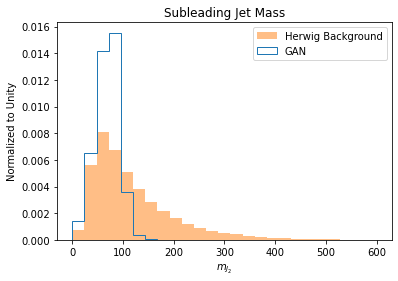

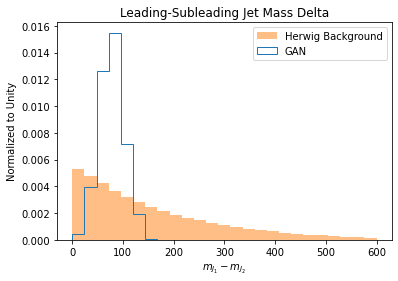

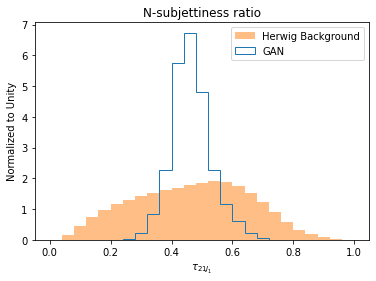

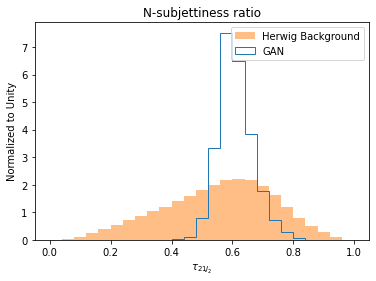

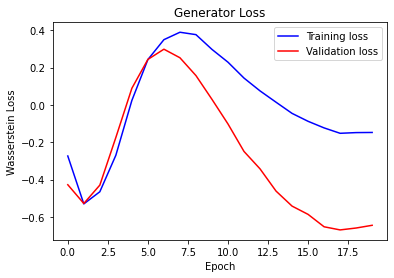

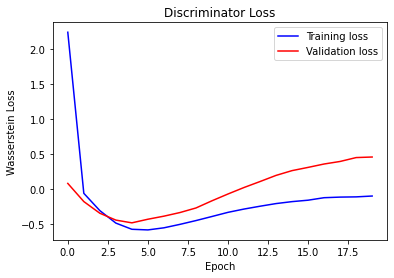

  3%|▎         | 30/1000 [05:49<3:10:57, 11.81s/it]
Epoch 30:

Generator training loss: -0.0009081989813492968
Discriminator training loss: -0.045709415418819885

Generator validation loss: -0.4780423369136503
Discriminator validation loss: 0.45717163961075397
  4%|▍         | 39/1000 [07:37<3:10:42, 11.91s/it]
Epoch 40:

Generator training loss: -0.1696001945821762
Discriminator training loss: 0.21018667611203018

Generator validation loss: -0.4667864005218762
Discriminator validation loss: 0.6774085523774396

Epoch 40:


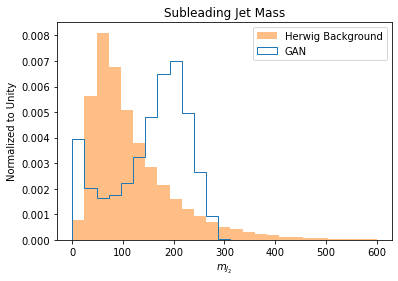

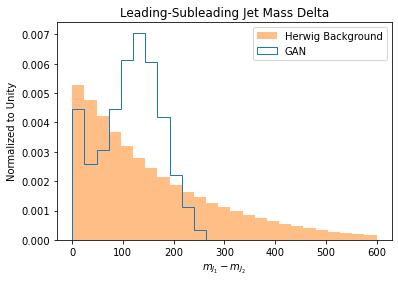

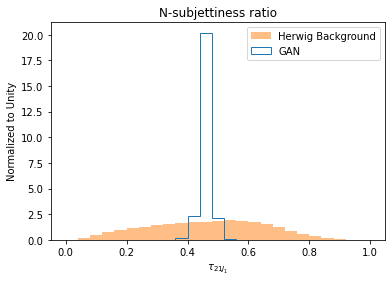

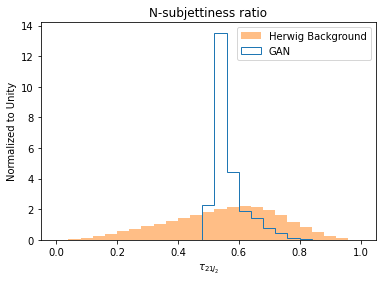

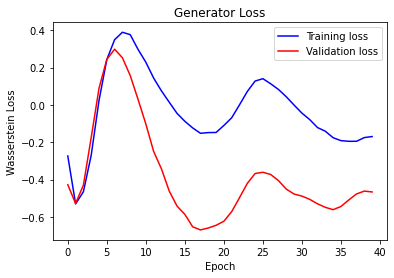

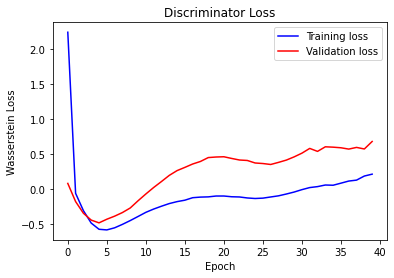

  5%|▌         | 50/1000 [09:48<3:06:02, 11.75s/it]
Epoch 50:

Generator training loss: -0.7796531662222799
Discriminator training loss: 0.47969804104618685

Generator validation loss: -0.9838139764109614
Discriminator validation loss: 0.530922066496655
  6%|▌         | 59/1000 [11:29<2:53:02, 11.03s/it]
Epoch 60:

Generator training loss: -1.4773913639816432
Discriminator training loss: 0.23570302921306643

Generator validation loss: -1.4805373645952473
Discriminator validation loss: 0.2547228966274712

Epoch 60:


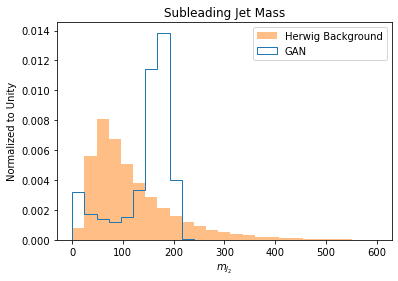

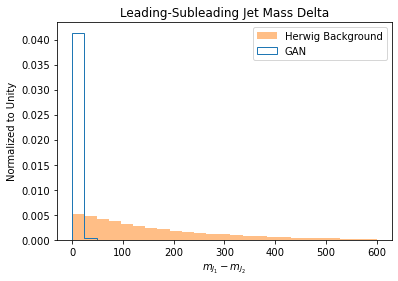

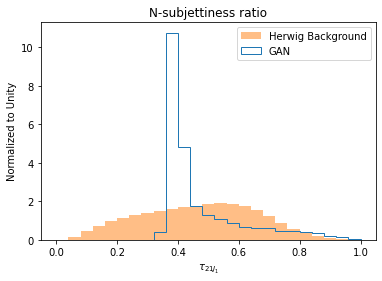

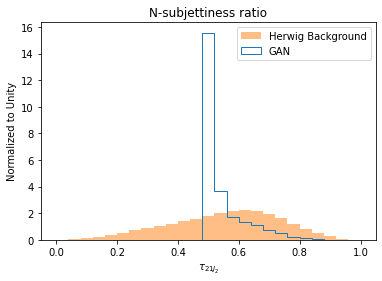

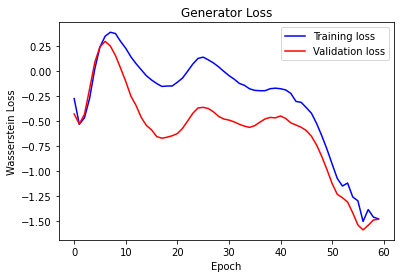

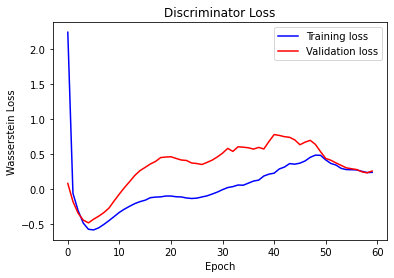

  7%|▋         | 70/1000 [13:33<2:49:08, 10.91s/it]
Epoch 70:

Generator training loss: -1.5912367071691755
Discriminator training loss: 0.2131024864922105

Generator validation loss: -1.6469350576889301
Discriminator validation loss: 0.2370966412279694
  8%|▊         | 79/1000 [15:12<2:48:05, 10.95s/it]
Epoch 80:

Generator training loss: -1.5340746118804136
Discriminator training loss: 0.21860712511265218

Generator validation loss: -1.6259454690286375
Discriminator validation loss: 0.22673591543905058

Epoch 80:


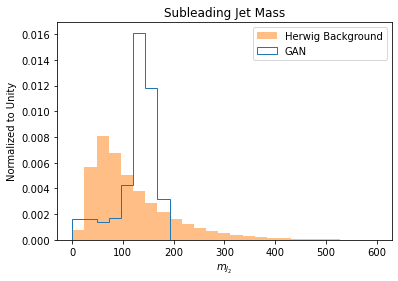

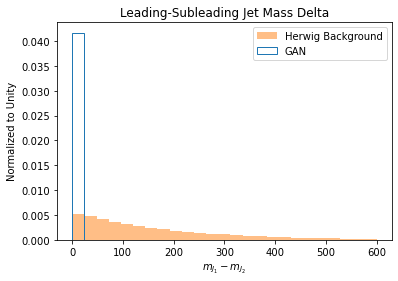

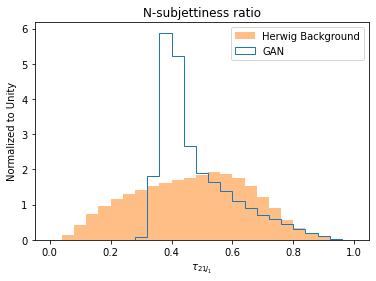

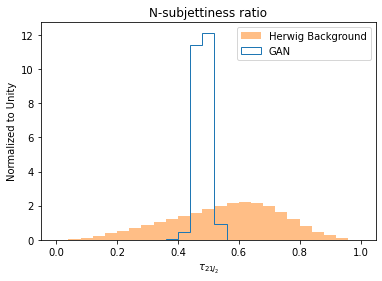

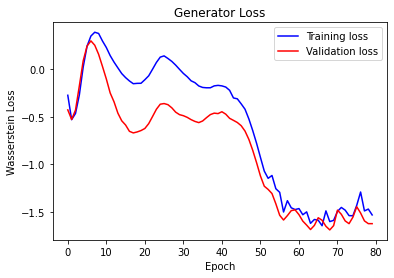

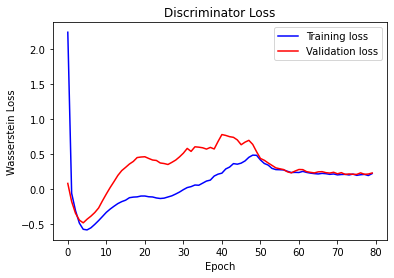

  9%|▉         | 90/1000 [17:59<4:45:16, 18.81s/it]
Epoch 90:

Generator training loss: -1.2494463306632861
Discriminator training loss: 0.23416325343388517

Generator validation loss: -1.545073616455811
Discriminator validation loss: 0.266005132179402
 10%|▉         | 99/1000 [20:18<3:20:42, 13.37s/it]
Epoch 100:

Generator training loss: -1.187610812078082
Discriminator training loss: 0.2874463436135239

Generator validation loss: -1.4232767069193195
Discriminator validation loss: 0.3391507594983601

Epoch 100:


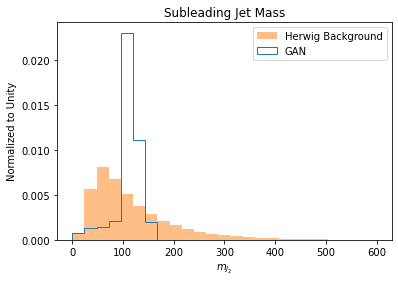

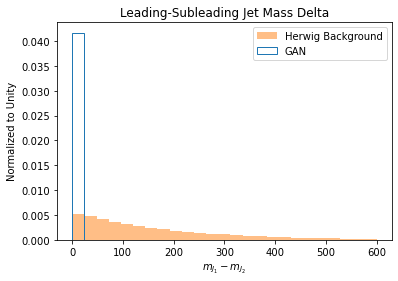

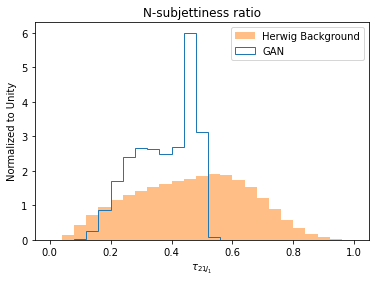

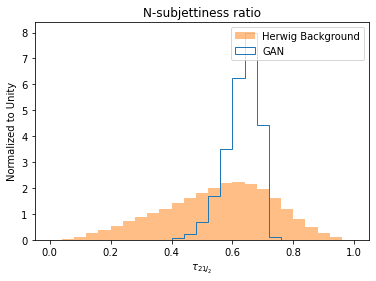

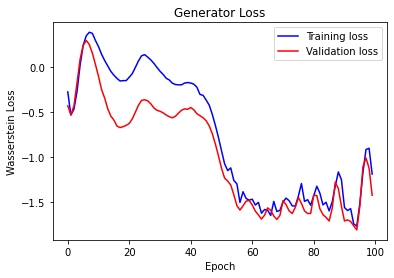

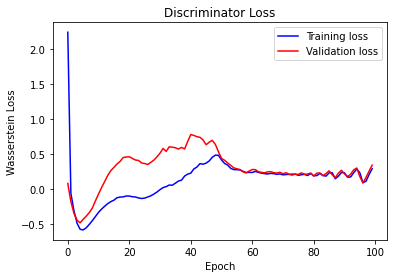

 11%|█         | 110/1000 [22:33<2:59:26, 12.10s/it]
Epoch 110:

Generator training loss: 0.4355067145232053
Discriminator training loss: 0.011935016283395876

Generator validation loss: 0.6209907574487508
Discriminator validation loss: -0.11272195474717951
 12%|█▏        | 119/1000 [24:20<2:54:30, 11.88s/it]
Epoch 120:

Generator training loss: 1.2479149505414604
Discriminator training loss: -0.2059349898942947

Generator validation loss: 1.2930004986338914
Discriminator validation loss: -0.21054133355281585

Epoch 120:


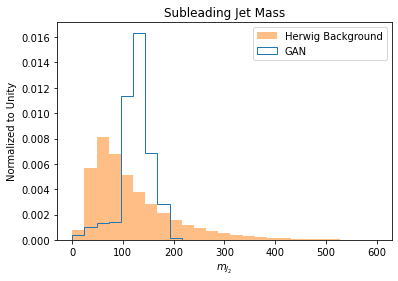

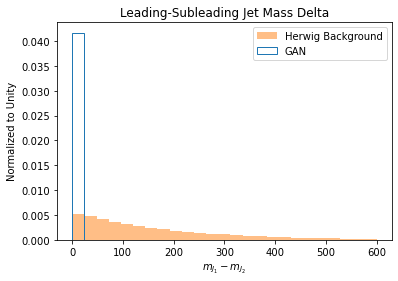

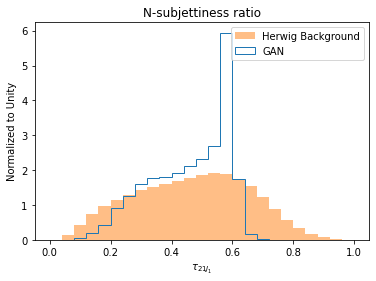

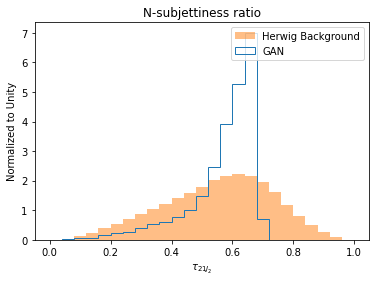

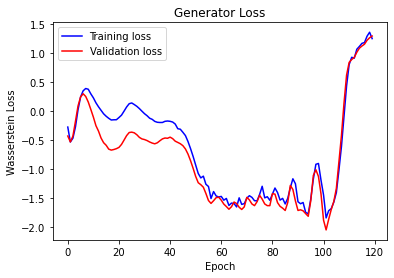

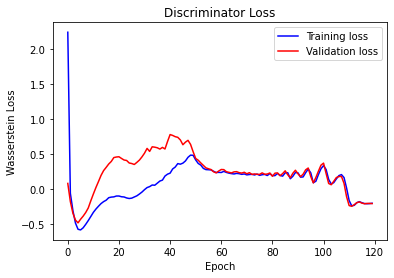

 13%|█▎        | 130/1000 [26:33<2:54:24, 12.03s/it]
Epoch 130:

Generator training loss: 0.4374747226126699
Discriminator training loss: 0.14091588755666518

Generator validation loss: 0.2934458509362376
Discriminator validation loss: 0.17574534679717227
 14%|█▍        | 139/1000 [28:22<2:50:52, 11.91s/it]
Epoch 140:

Generator training loss: -0.5625966733291018
Discriminator training loss: 0.13666688799248175

Generator validation loss: -0.6239418136413952
Discriminator validation loss: 0.13065108855075552

Epoch 140:


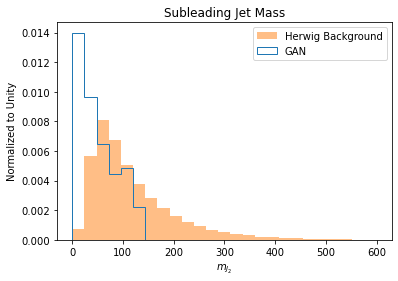

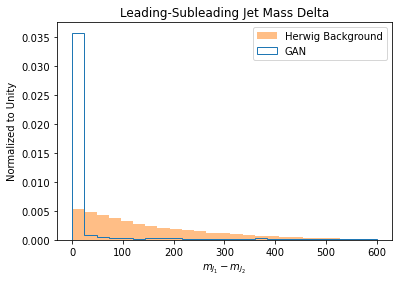

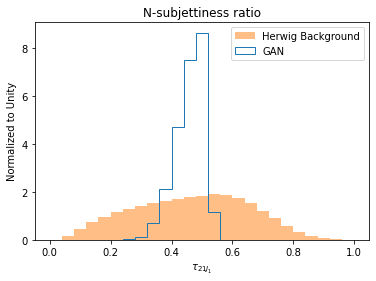

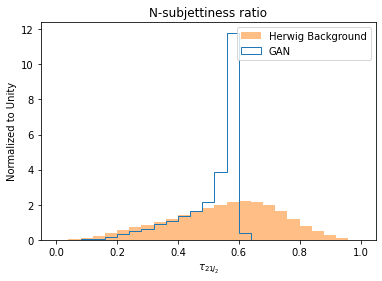

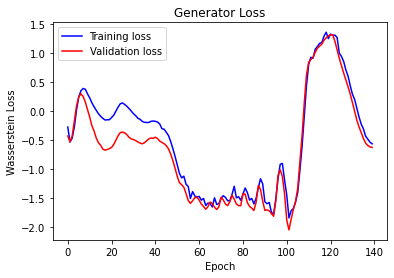

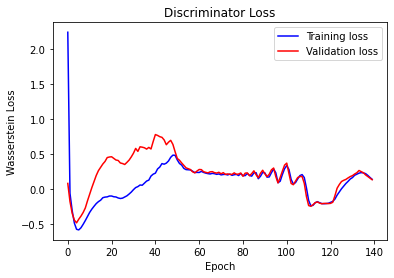

 15%|█▌        | 150/1000 [30:33<2:46:28, 11.75s/it]
Epoch 150:

Generator training loss: -0.528066663295438
Discriminator training loss: 0.04742079372216784

Generator validation loss: -0.6557278964729587
Discriminator validation loss: 0.04889379347460803
 16%|█▌        | 159/1000 [32:19<2:44:32, 11.74s/it]
Epoch 160:

Generator training loss: -0.8663287639740065
Discriminator training loss: 0.13747860371271176

Generator validation loss: -1.012893670040075
Discriminator validation loss: 0.1983466527470554

Epoch 160:


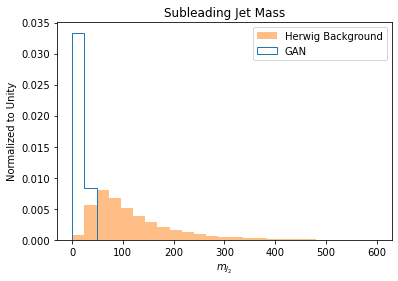

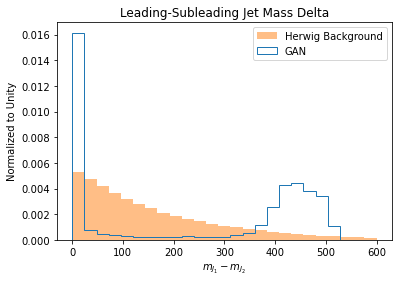

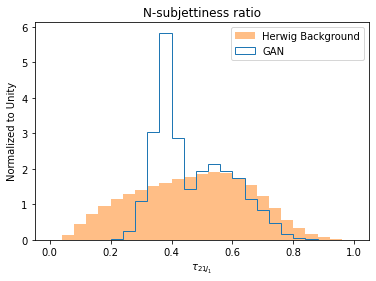

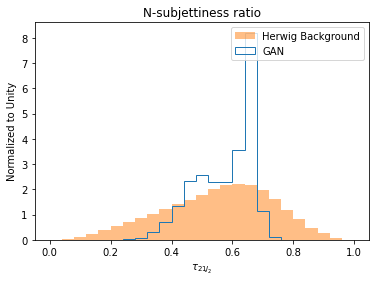

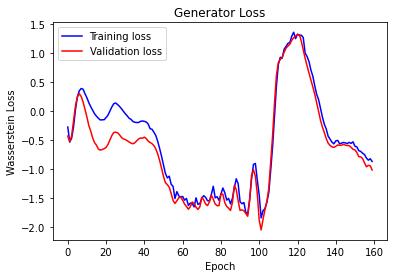

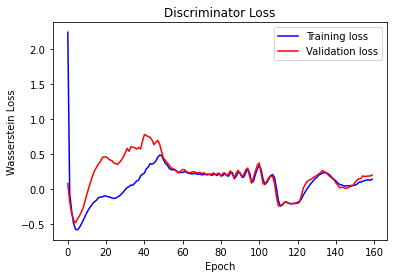

 17%|█▋        | 170/1000 [34:31<2:44:52, 11.92s/it]
Epoch 170:

Generator training loss: -1.1998593227052292
Discriminator training loss: 0.1547661792000785

Generator validation loss: -1.2734033473935258
Discriminator validation loss: 0.18311814225629955
 18%|█▊        | 179/1000 [36:24<2:45:43, 12.11s/it]
Epoch 180:

Generator training loss: -1.3630267073873603
Discriminator training loss: 0.15785250063043135

Generator validation loss: -1.4009097180649899
Discriminator validation loss: 0.17368342999949074

Epoch 180:


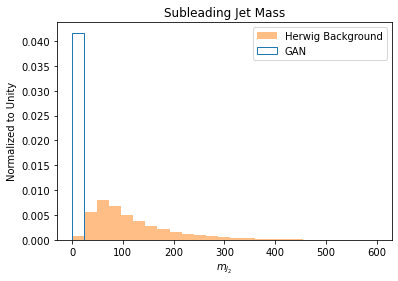

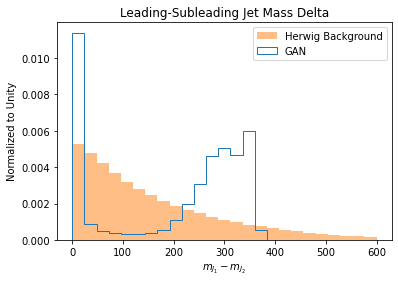

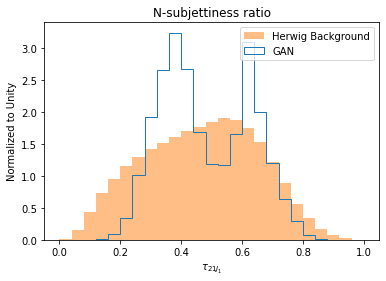

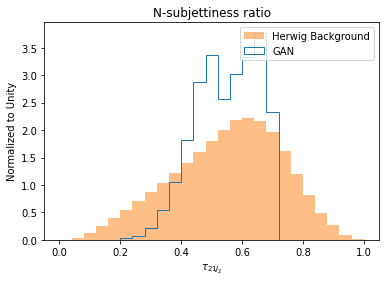

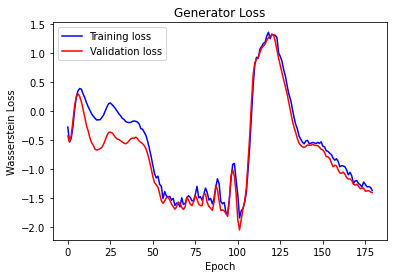

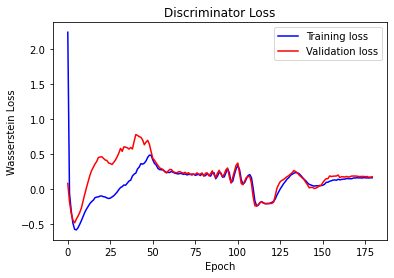

 19%|█▉        | 190/1000 [38:40<2:42:27, 12.03s/it]
Epoch 190:

Generator training loss: -1.3571080186816522
Discriminator training loss: 0.15939194007020124

Generator validation loss: -1.509607696753056
Discriminator validation loss: 0.15274185309430843
 20%|█▉        | 199/1000 [40:28<2:40:13, 12.00s/it]
Epoch 200:

Generator training loss: -1.5929363313757003
Discriminator training loss: 0.16311228197418484

Generator validation loss: -1.6383199970253177
Discriminator validation loss: 0.16041662603555618

Epoch 200:


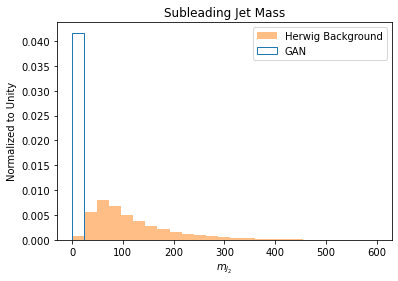

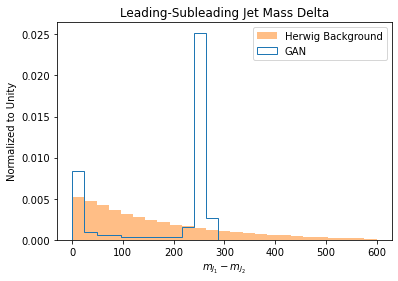

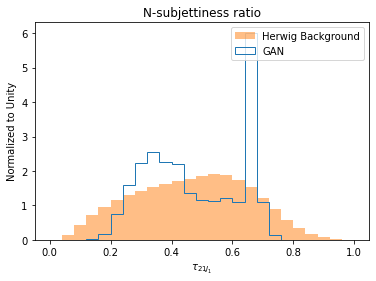

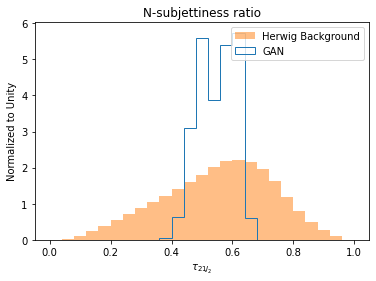

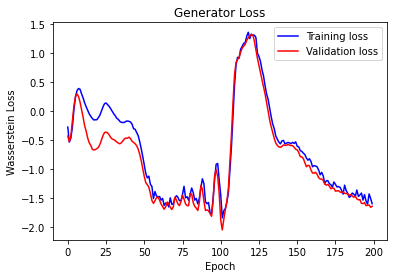

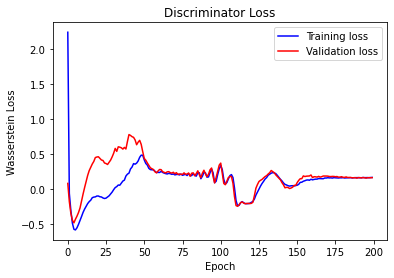

 21%|██        | 210/1000 [42:41<2:39:22, 12.10s/it]
Epoch 210:

Generator training loss: -1.6354128596235515
Discriminator training loss: 0.1657125217761512

Generator validation loss: -1.7502013396044243
Discriminator validation loss: 0.1622477982758132
 22%|██▏       | 219/1000 [44:28<2:33:51, 11.82s/it]
Epoch 220:

Generator training loss: -1.5929264597635462
Discriminator training loss: 0.16918872301843718

Generator validation loss: -1.8959214054658746
Discriminator validation loss: 0.1826262602613108

Epoch 220:


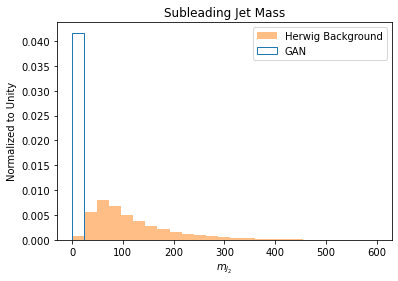

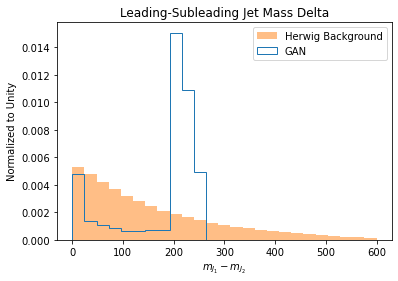

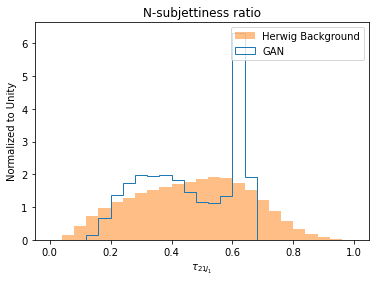

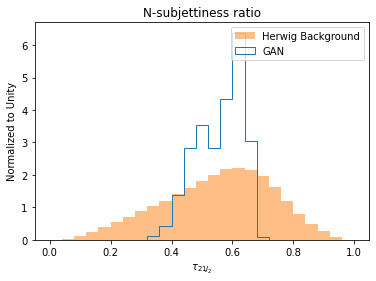

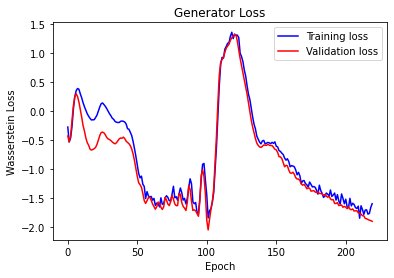

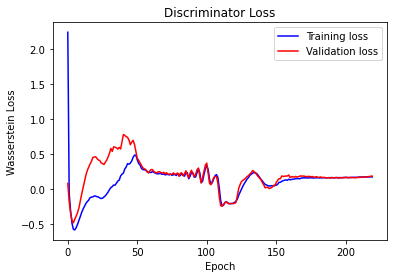

 23%|██▎       | 230/1000 [46:42<2:33:22, 11.95s/it]
Epoch 230:

Generator training loss: -1.7021471687434806
Discriminator training loss: 0.17465342940760115

Generator validation loss: -1.8493410249958253
Discriminator validation loss: 0.18332687282904234
 24%|██▍       | 239/1000 [48:31<2:31:39, 11.96s/it]
Epoch 240:

Generator training loss: -1.801760888816229
Discriminator training loss: 0.1635332130812696

Generator validation loss: -1.8637784142963227
Discriminator validation loss: 0.17992491714778466

Epoch 240:


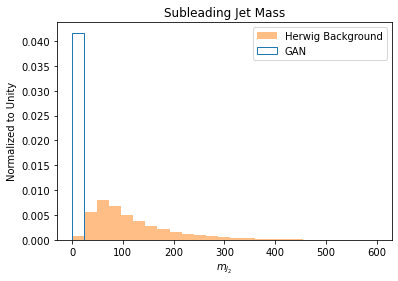

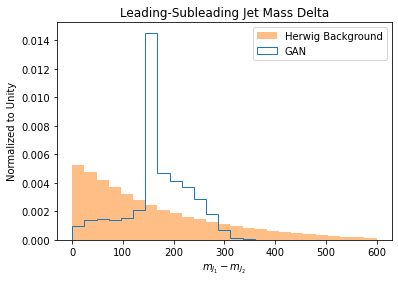

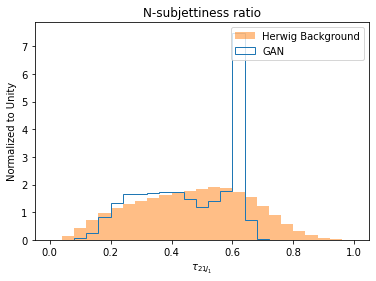

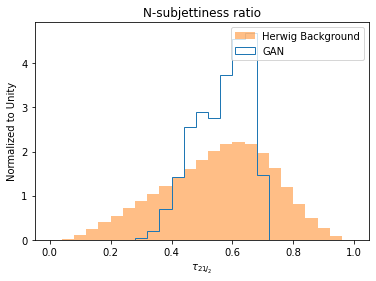

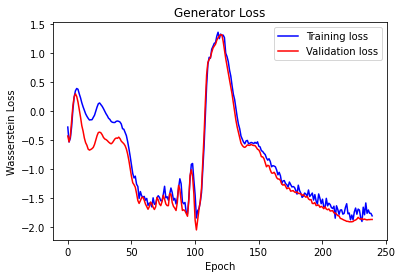

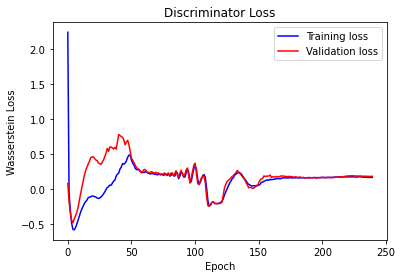

 25%|██▌       | 250/1000 [50:48<2:32:52, 12.23s/it]
Epoch 250:

Generator training loss: -1.6867225629384401
Discriminator training loss: 0.1509737275876241

Generator validation loss: -1.8274846213762908
Discriminator validation loss: 0.18460492721041216
 26%|██▌       | 259/1000 [52:37<2:27:37, 11.95s/it]
Epoch 260:

Generator training loss: -1.482866922281481
Discriminator training loss: 0.13726477247239108

Generator validation loss: -1.711852995098614
Discriminator validation loss: 0.18417391217634319

Epoch 260:


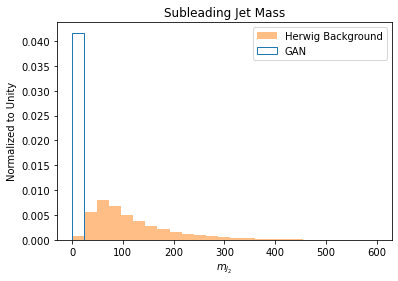

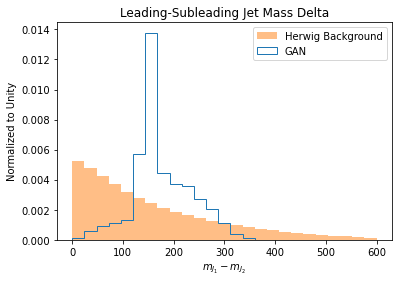

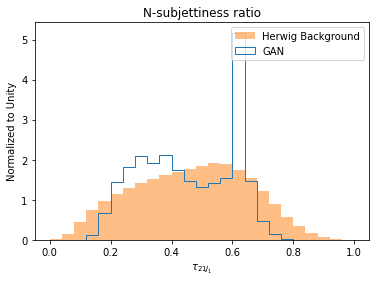

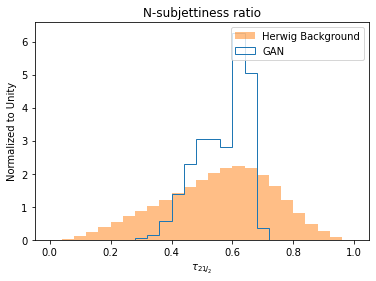

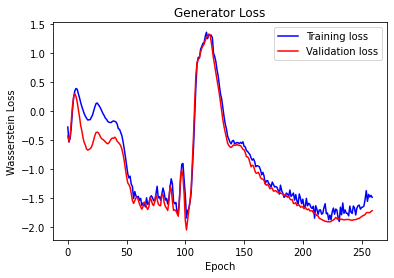

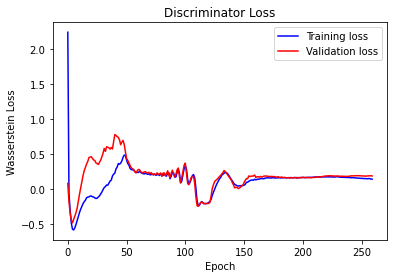

 27%|██▋       | 270/1000 [54:51<2:24:27, 11.87s/it]
Epoch 270:

Generator training loss: -1.1918361802570148
Discriminator training loss: 0.12014442564528932

Generator validation loss: -1.636920556303907
Discriminator validation loss: 0.19032889190816973
 28%|██▊       | 279/1000 [56:39<2:24:47, 12.05s/it]
Epoch 280:

Generator training loss: -0.9979601144342803
Discriminator training loss: 0.10596655849370566

Generator validation loss: -1.6089323911754816
Discriminator validation loss: 0.18571412477825522

Epoch 280:


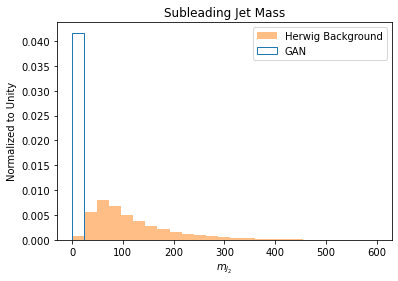

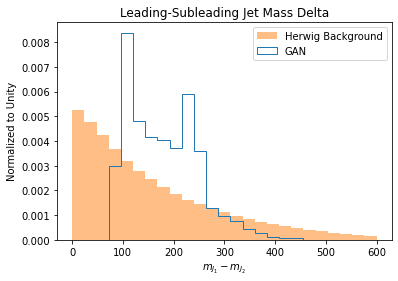

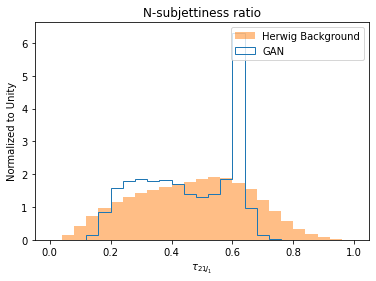

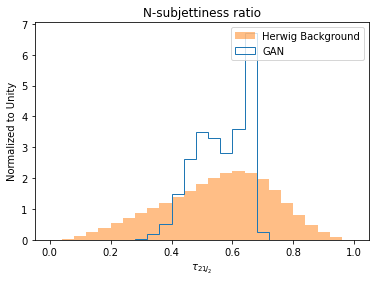

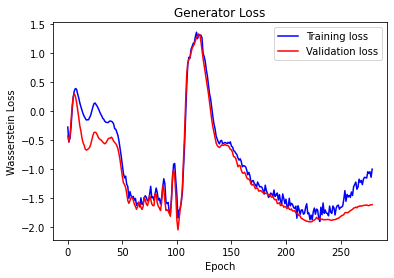

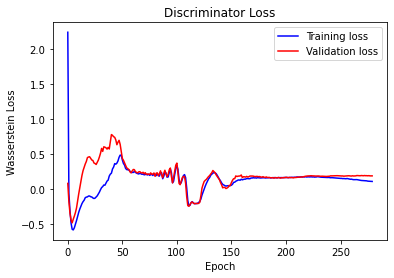

 29%|██▉       | 290/1000 [58:55<2:23:12, 12.10s/it]
Epoch 290:

Generator training loss: -0.8548670649894928
Discriminator training loss: 0.08391744134184931

Generator validation loss: -1.5238846804274906
Discriminator validation loss: 0.19071525755170413
 30%|██▉       | 299/1000 [1:00:47<2:35:10, 13.28s/it]
Epoch 300:

Generator training loss: -0.5024830304859762
Discriminator training loss: 0.056985195732229585

Generator validation loss: -1.4023581575907638
Discriminator validation loss: 0.18877842512409201

Epoch 300:


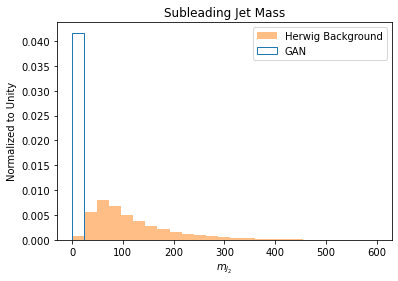

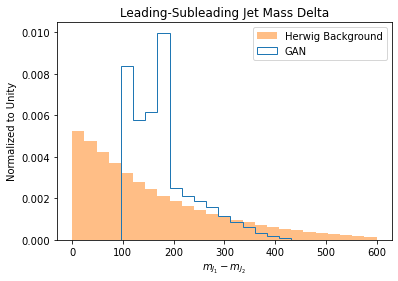

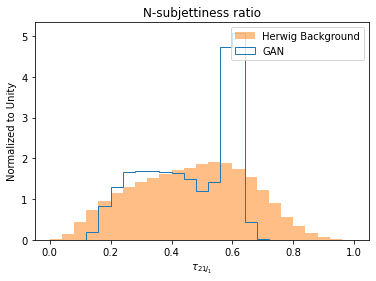

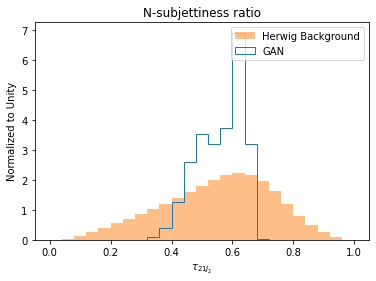

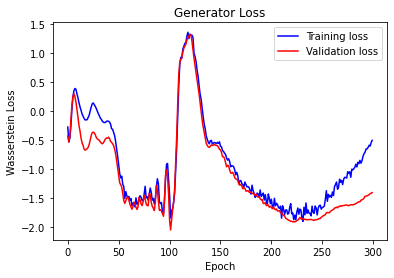

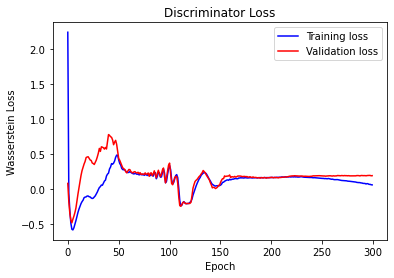

 31%|███       | 310/1000 [1:03:05<2:21:16, 12.28s/it]
Epoch 310:

Generator training loss: -0.19647115291874914
Discriminator training loss: 0.02749487375522064

Generator validation loss: -1.2773259545935973
Discriminator validation loss: 0.19298998524480696
 32%|███▏      | 319/1000 [1:04:54<2:17:43, 12.13s/it]
Epoch 320:

Generator training loss: 0.17341560986315402
Discriminator training loss: -0.011327069890737475

Generator validation loss: -1.1611222351183648
Discriminator validation loss: 0.2134752524558639

Epoch 320:


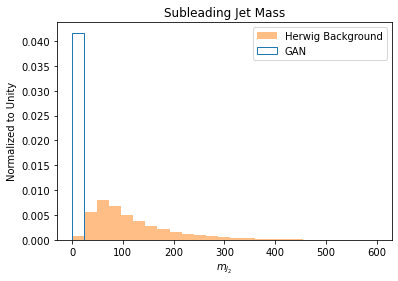

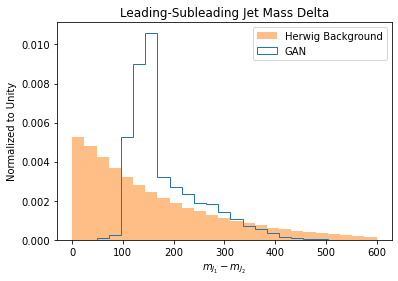

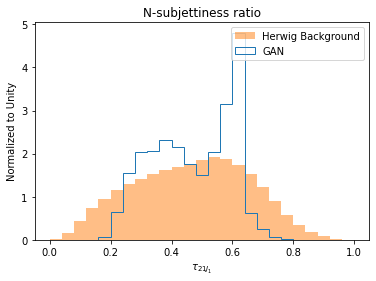

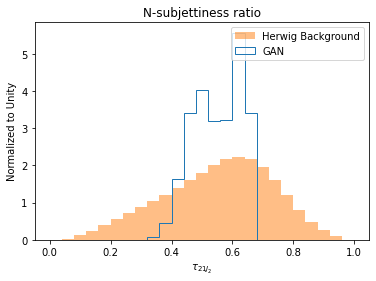

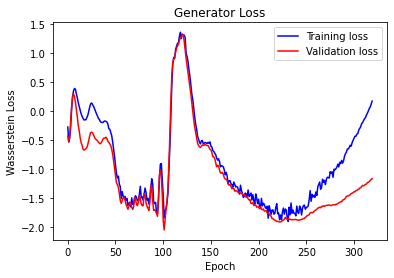

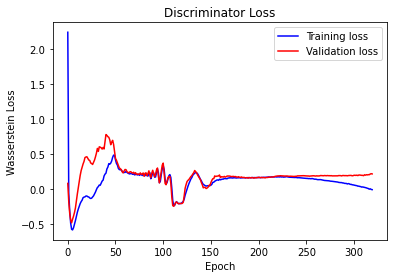

 33%|███▎      | 330/1000 [1:07:08<2:13:20, 11.94s/it]
Epoch 330:

Generator training loss: 0.6628789385790872
Discriminator training loss: -0.06558021653425954

Generator validation loss: -0.9422749292532934
Discriminator validation loss: 0.2812762600140736
 34%|███▍      | 339/1000 [1:08:57<2:12:16, 12.01s/it]
Epoch 340:

Generator training loss: 2.2735884030415714
Discriminator training loss: -0.2460581020677835

Generator validation loss: 1.0558969870698252
Discriminator validation loss: -0.21431623077111675

Epoch 340:


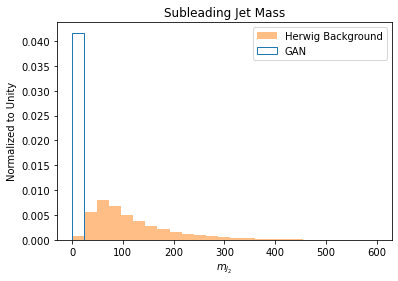

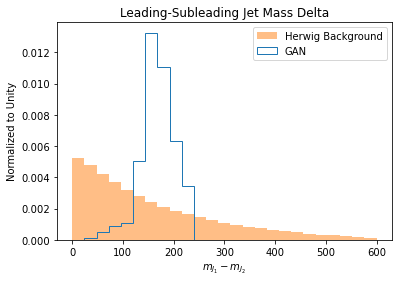

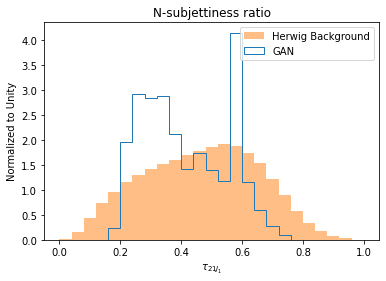

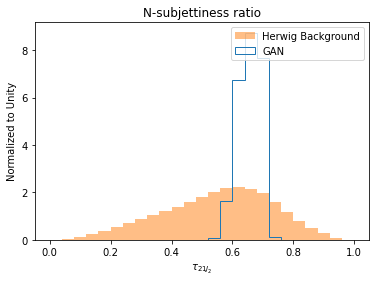

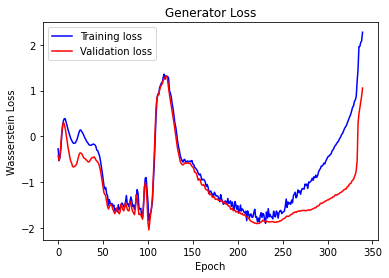

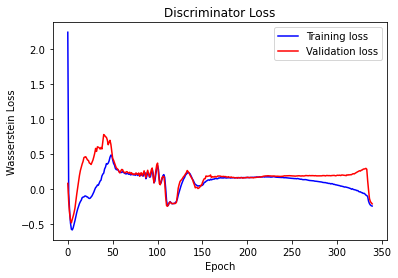

 35%|███▌      | 350/1000 [1:11:12<2:11:19, 12.12s/it]
Epoch 350:

Generator training loss: 3.1764691693535316
Discriminator training loss: -0.34237107963234814

Generator validation loss: 1.6723219714448103
Discriminator validation loss: -0.1910005898489693
 36%|███▌      | 359/1000 [1:13:02<2:10:01, 12.17s/it]
Epoch 360:

Generator training loss: 3.645427931364766
Discriminator training loss: -0.30180896483785824

Generator validation loss: 1.6722060296623447
Discriminator validation loss: -0.14059425417150623

Epoch 360:


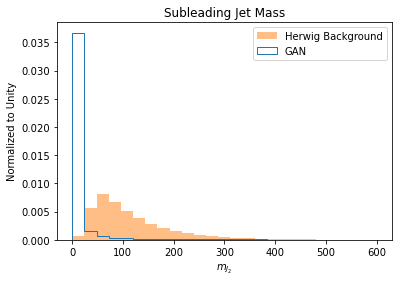

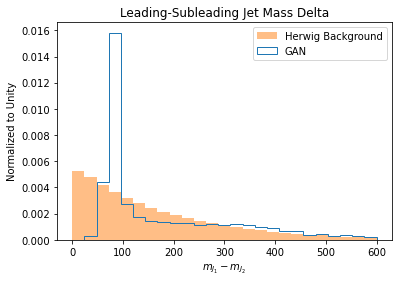

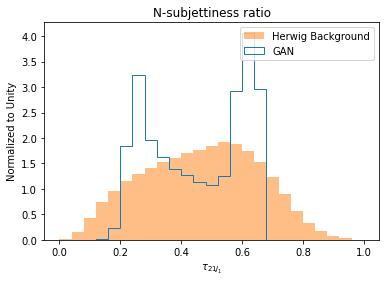

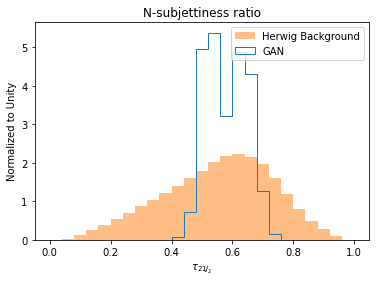

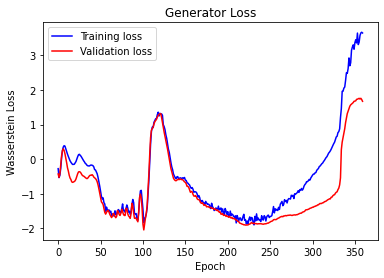

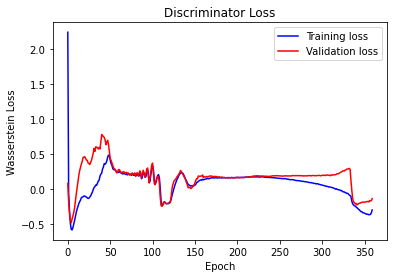

 37%|███▋      | 370/1000 [1:15:18<2:06:16, 12.03s/it]
Epoch 370:

Generator training loss: 2.896561506585996
Discriminator training loss: 0.0029634586977518

Generator validation loss: 2.0020289644598943
Discriminator validation loss: -0.07477520927634157
 38%|███▊      | 379/1000 [1:17:12<2:11:56, 12.75s/it]
Epoch 380:

Generator training loss: 3.129317483208218
Discriminator training loss: -0.013280039316241558

Generator validation loss: 2.5473261580604016
Discriminator validation loss: 0.0007606150017532201

Epoch 380:


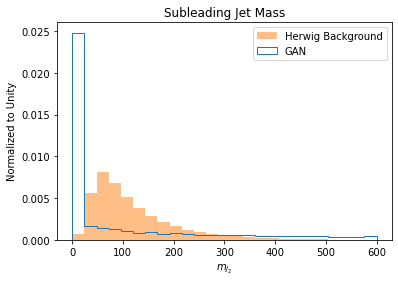

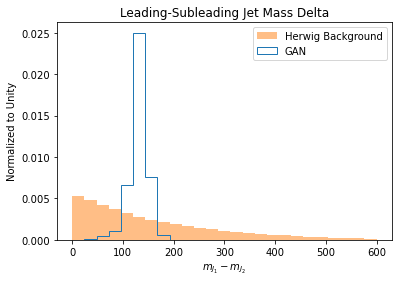

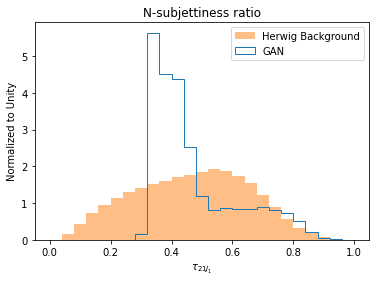

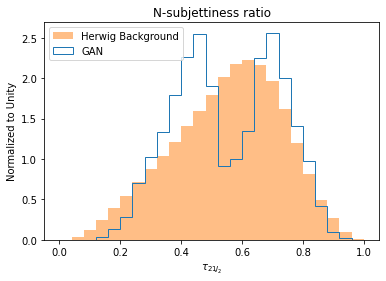

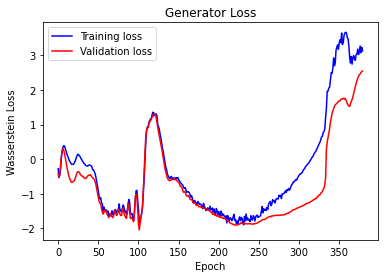

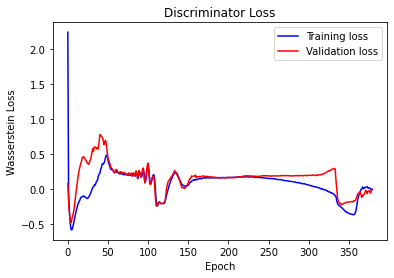

 39%|███▉      | 390/1000 [1:19:30<2:03:17, 12.13s/it]
Epoch 390:

Generator training loss: 3.4000708533277946
Discriminator training loss: -0.028890965098076288

Generator validation loss: 3.1900041125348335
Discriminator validation loss: -0.002960877649158764
 40%|███▉      | 399/1000 [1:21:23<2:05:15, 12.51s/it]
Epoch 400:

Generator training loss: 3.964734118574306
Discriminator training loss: -0.007714028016484702

Generator validation loss: 3.7915366357955755
Discriminator validation loss: 0.015066797028667358

Epoch 400:


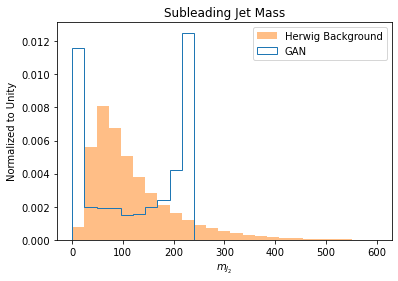

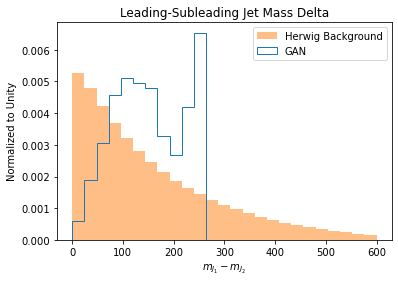

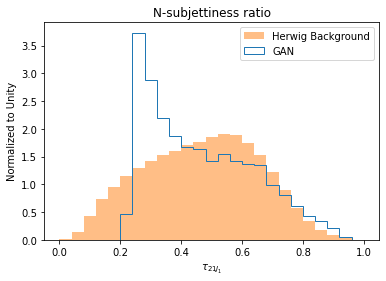

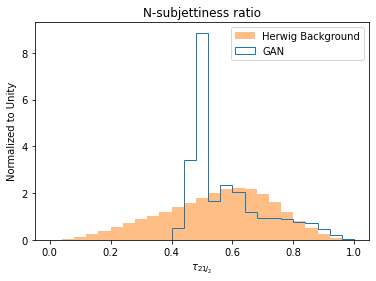

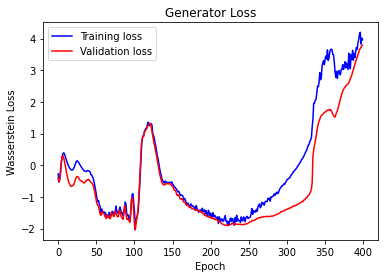

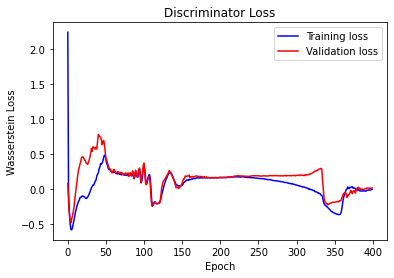

 41%|████      | 410/1000 [1:23:40<2:00:05, 12.21s/it]
Epoch 410:

Generator training loss: 3.935553068753149
Discriminator training loss: 0.004339265629754204

Generator validation loss: 3.7439369080496574
Discriminator validation loss: 0.01897461633162775
 42%|████▏     | 419/1000 [1:25:30<1:57:56, 12.18s/it]
Epoch 420:

Generator training loss: 4.522891050316603
Discriminator training loss: 0.019120064701696086

Generator validation loss: 4.112770680032793
Discriminator validation loss: 0.026616447616911676

Epoch 420:


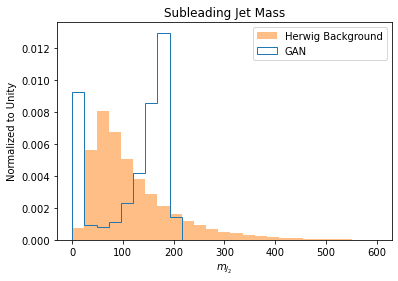

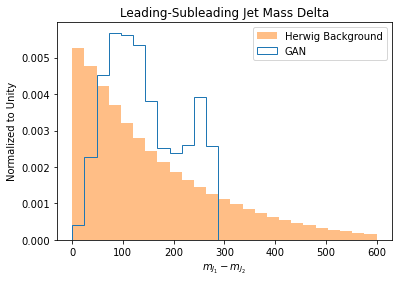

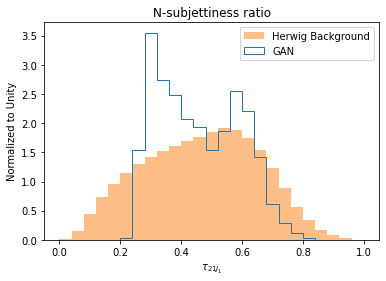

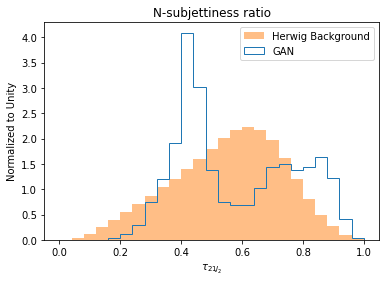

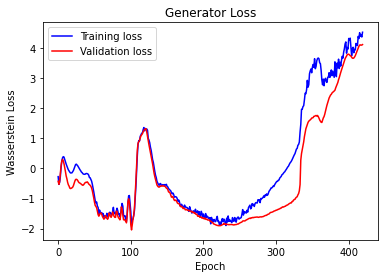

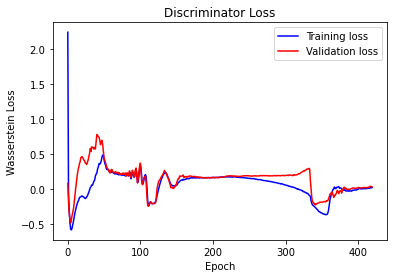

 43%|████▎     | 430/1000 [1:27:46<1:55:09, 12.12s/it]
Epoch 430:

Generator training loss: 4.6084026992321
Discriminator training loss: 0.028527540091140155

Generator validation loss: 4.391672233577627
Discriminator validation loss: 0.010254845833349109
 44%|████▍     | 439/1000 [1:29:37<1:54:11, 12.21s/it]
Epoch 440:

Generator training loss: 4.557335165843285
Discriminator training loss: 0.024278166780525873

Generator validation loss: 4.033667826750238
Discriminator validation loss: 0.015627256537520024

Epoch 440:


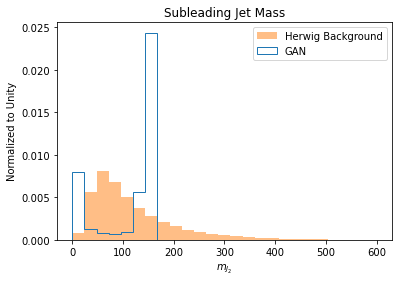

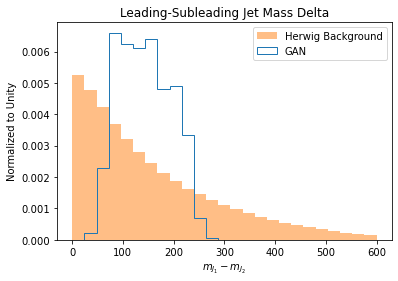

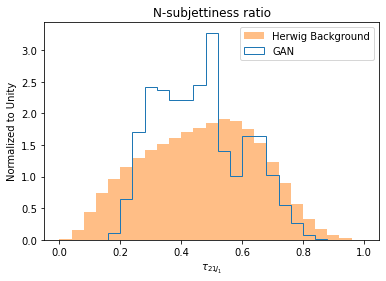

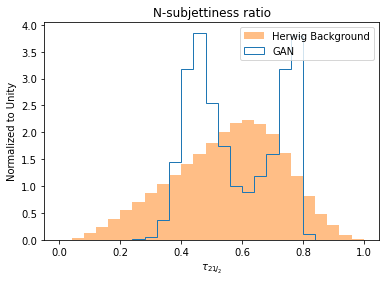

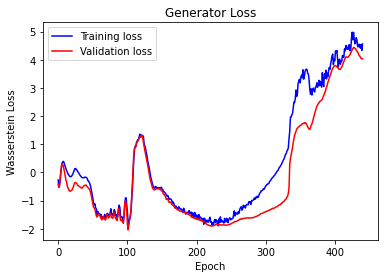

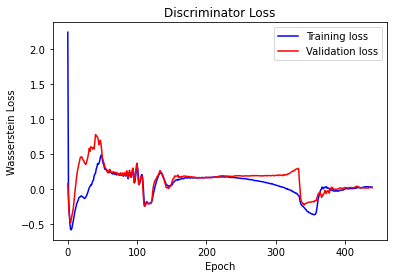

 45%|████▌     | 450/1000 [1:31:55<1:52:53, 12.32s/it]
Epoch 450:

Generator training loss: 4.147104098171485
Discriminator training loss: 0.022261643727807597

Generator validation loss: 3.928021544071493
Discriminator validation loss: 0.015772608278126196
 46%|████▌     | 459/1000 [1:33:48<1:51:12, 12.33s/it]
Epoch 460:

Generator training loss: 4.047142884037535
Discriminator training loss: 0.020490867240657237

Generator validation loss: 3.8325385614985343
Discriminator validation loss: 0.0012931992656883629

Epoch 460:


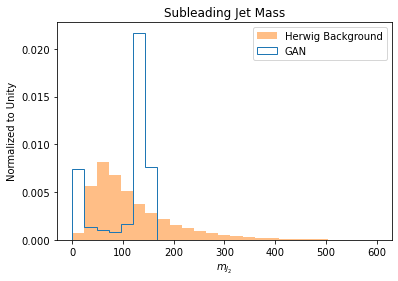

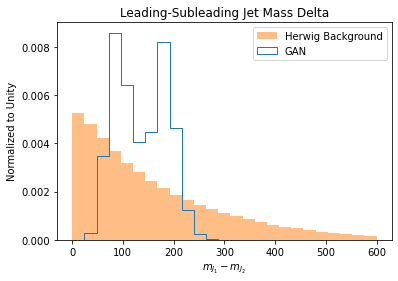

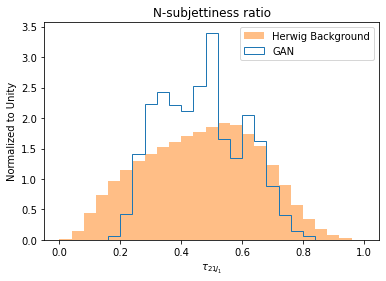

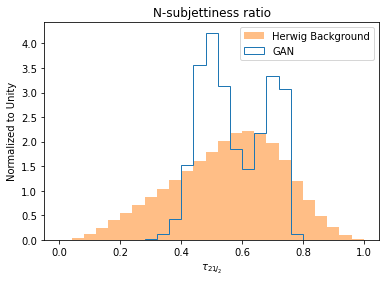

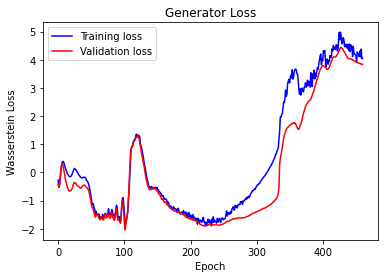

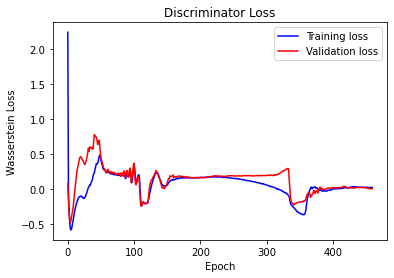

 47%|████▋     | 470/1000 [1:36:07<1:49:25, 12.39s/it]
Epoch 470:

Generator training loss: 4.176364608231136
Discriminator training loss: 0.014757954309304998

Generator validation loss: 3.575108901154798
Discriminator validation loss: 0.0033446044991981842
 48%|████▊     | 479/1000 [1:37:59<1:49:44, 12.64s/it]
Epoch 480:

Generator training loss: 3.527146815195109
Discriminator training loss: 0.016766131446592888

Generator validation loss: 3.3937189539924923
Discriminator validation loss: 0.006480498976058892

Epoch 480:


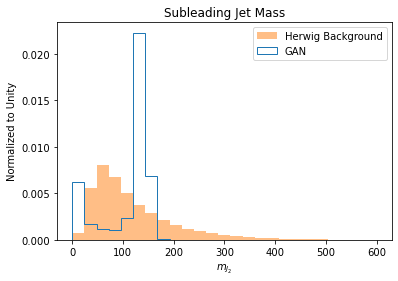

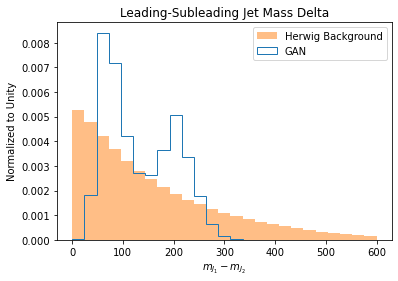

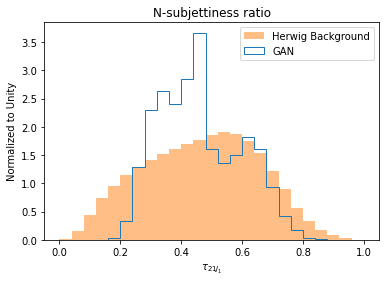

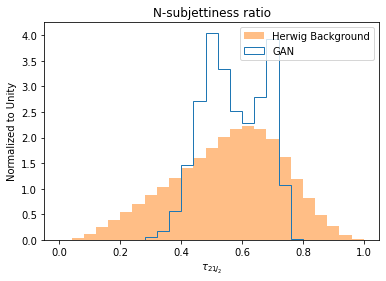

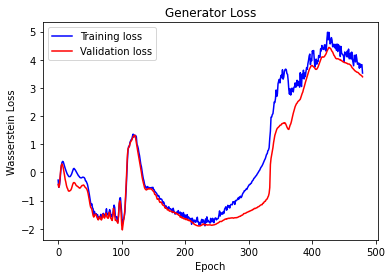

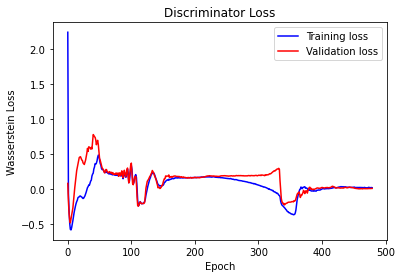

 49%|████▉     | 490/1000 [1:40:18<1:43:56, 12.23s/it]
Epoch 490:

Generator training loss: 3.832872919534723
Discriminator training loss: 0.016583784471276376

Generator validation loss: 3.1819269815917894
Discriminator validation loss: 0.0002632073965566979
 50%|████▉     | 499/1000 [1:42:09<1:42:22, 12.26s/it]
Epoch 500:

Generator training loss: 3.6535054579621438
Discriminator training loss: 0.010367222701307202

Generator validation loss: 3.002184526597862
Discriminator validation loss: 0.003484355432237119

Epoch 500:


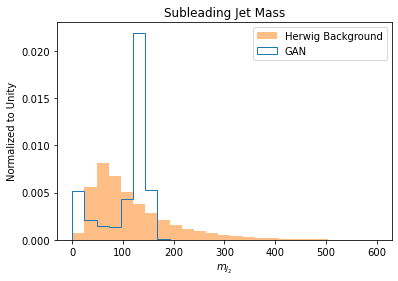

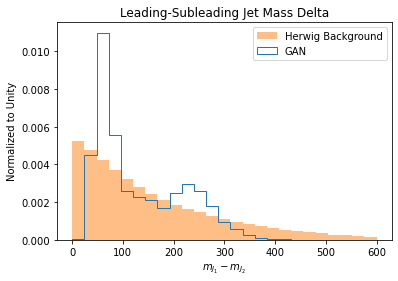

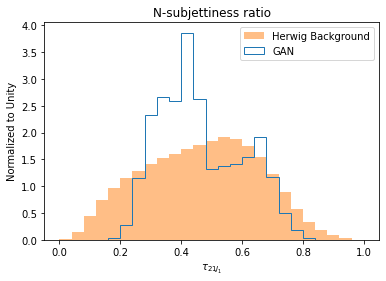

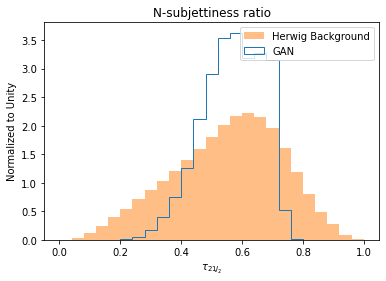

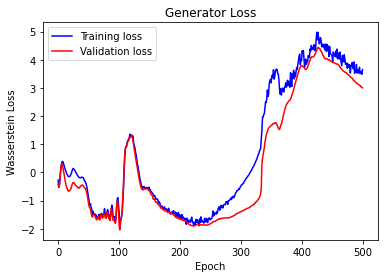

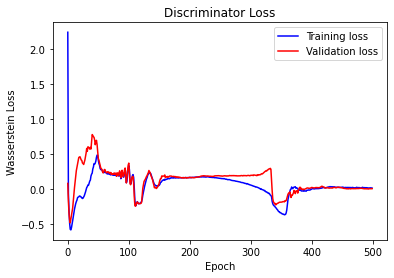

 51%|█████     | 510/1000 [1:44:26<1:39:27, 12.18s/it]
Epoch 510:

Generator training loss: 3.338580375404959
Discriminator training loss: 0.010037986389662098

Generator validation loss: 2.799083947646811
Discriminator validation loss: 0.005287415300285905
 52%|█████▏    | 519/1000 [1:46:16<1:37:28, 12.16s/it]
Epoch 520:

Generator training loss: 3.408843863938672
Discriminator training loss: 0.006441168763618013

Generator validation loss: 2.7040653265401984
Discriminator validation loss: 0.006401157108946963

Epoch 520:


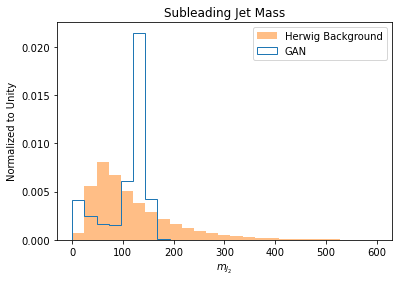

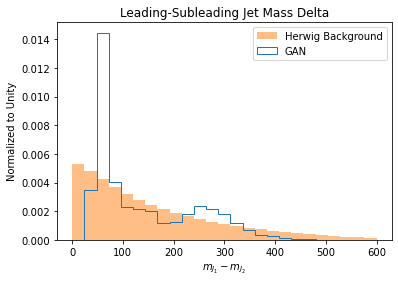

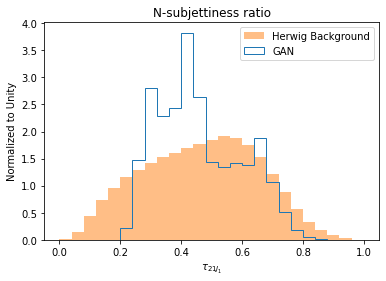

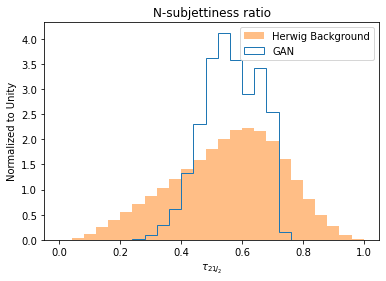

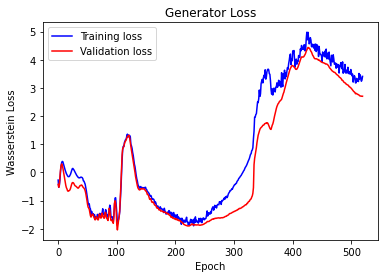

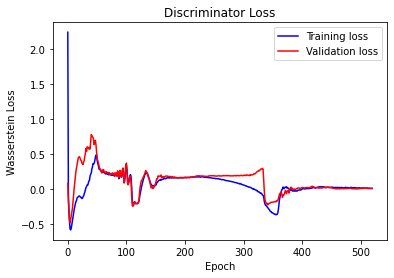

 53%|█████▎    | 530/1000 [1:48:33<1:36:10, 12.28s/it]
Epoch 530:

Generator training loss: 3.3488844978353347
Discriminator training loss: 0.004515424583796167

Generator validation loss: 2.6268716881998277
Discriminator validation loss: -0.0014615910639418708
 54%|█████▍    | 539/1000 [1:50:26<1:36:21, 12.54s/it]
Epoch 540:

Generator training loss: 3.3291305674881237
Discriminator training loss: 0.0003801383531811883

Generator validation loss: 2.607914250893671
Discriminator validation loss: 0.0023107101277353233

Epoch 540:


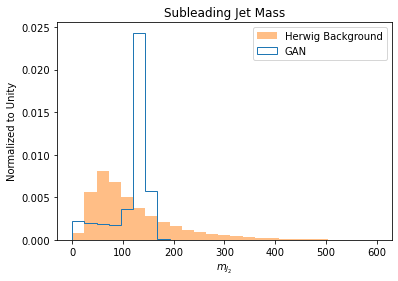

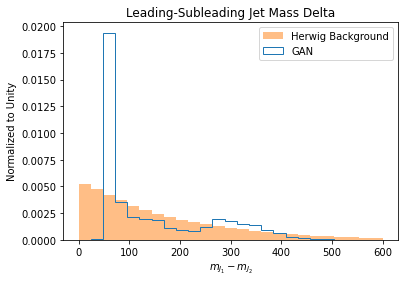

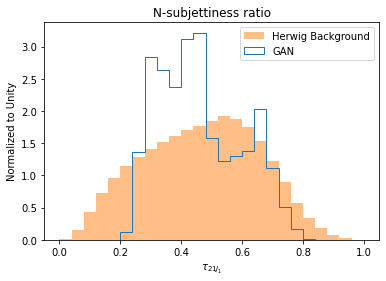

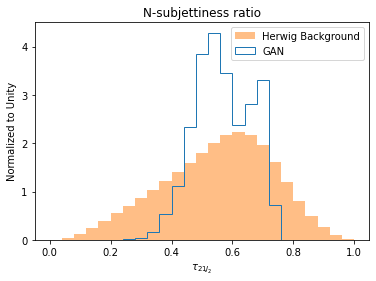

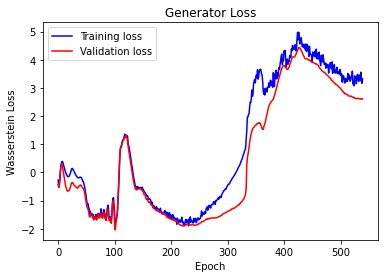

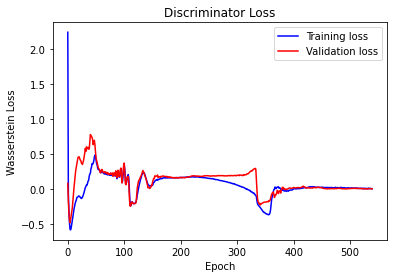

 55%|█████▌    | 550/1000 [1:52:44<1:32:30, 12.33s/it]
Epoch 550:

Generator training loss: 3.294854903481697
Discriminator training loss: 0.007270557536317612

Generator validation loss: 2.6650350423621356
Discriminator validation loss: -0.0010929136898144476
 56%|█████▌    | 559/1000 [1:54:41<1:40:19, 13.65s/it]
Epoch 560:

Generator training loss: 3.6205478912331395
Discriminator training loss: 0.003970269825321994

Generator validation loss: 2.7009122271518224
Discriminator validation loss: -0.01228384939091096

Epoch 560:


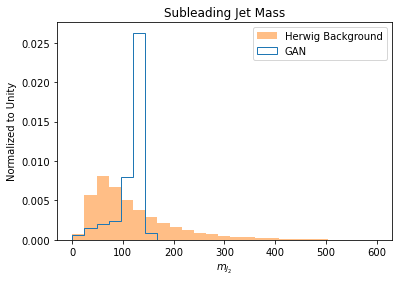

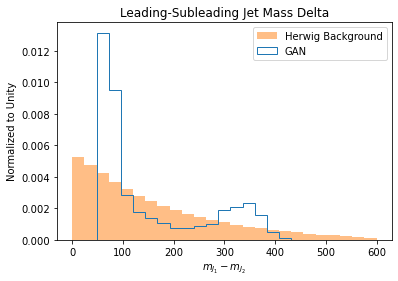

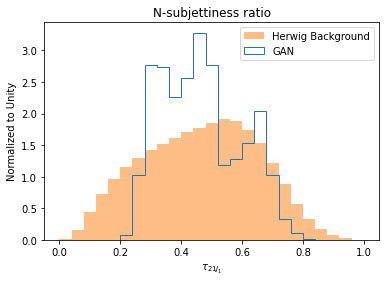

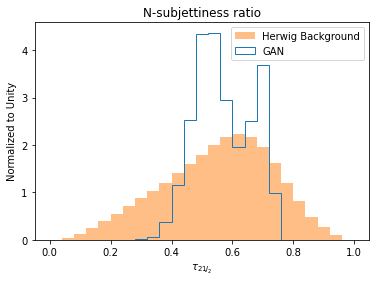

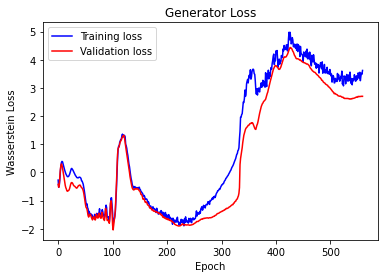

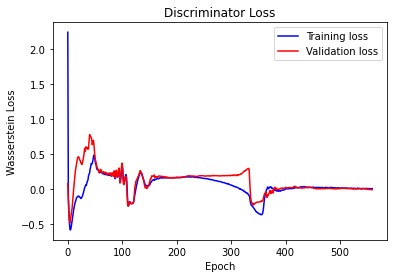

 57%|█████▋    | 570/1000 [1:57:00<1:28:58, 12.41s/it]
Epoch 570:

Generator training loss: 3.3308461695258096
Discriminator training loss: 0.0023307986356202104

Generator validation loss: 2.6769743561744677
Discriminator validation loss: -0.011199644479289835
 58%|█████▊    | 579/1000 [1:58:50<1:25:46, 12.23s/it]
Epoch 580:

Generator training loss: 3.370761312747915
Discriminator training loss: 0.0036312898708055923

Generator validation loss: 2.616599539752866
Discriminator validation loss: -0.011048658643645825

Epoch 580:


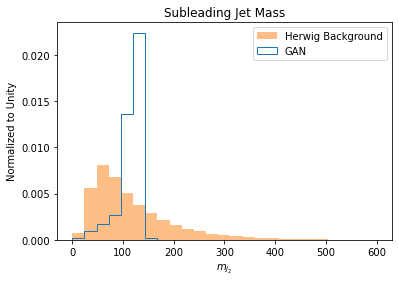

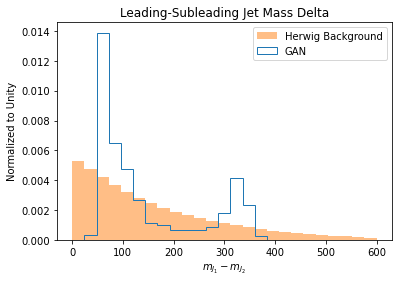

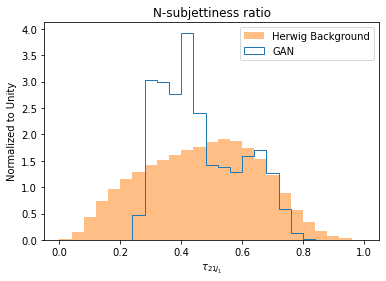

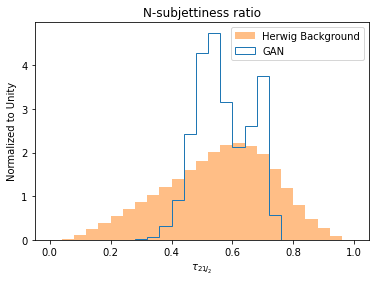

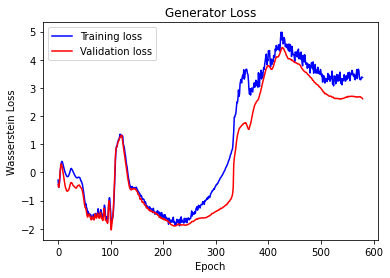

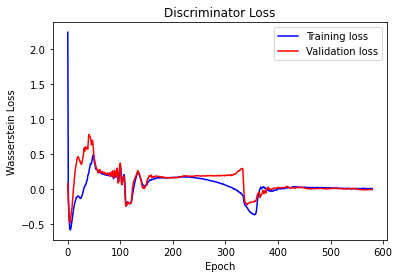

 59%|█████▉    | 590/1000 [2:01:08<1:24:05, 12.31s/it]
Epoch 590:

Generator training loss: 3.4744161114992353
Discriminator training loss: 0.003736540436057477

Generator validation loss: 2.517739380725092
Discriminator validation loss: -0.0030812290494934332
 60%|█████▉    | 599/1000 [2:03:00<1:21:35, 12.21s/it]
Epoch 600:

Generator training loss: 3.3126120607221057
Discriminator training loss: 0.0008173991119501283

Generator validation loss: 2.484854646882072
Discriminator validation loss: 7.321917914329084e-05

Epoch 600:


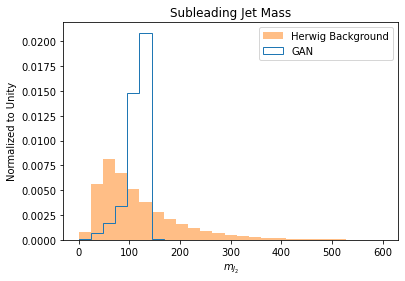

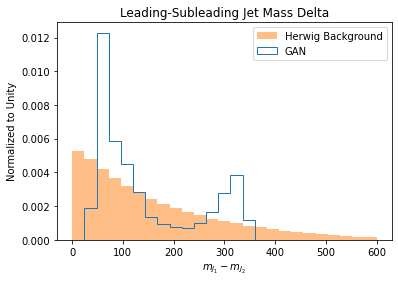

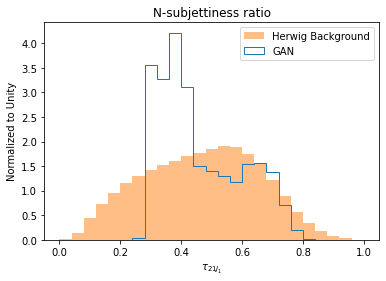

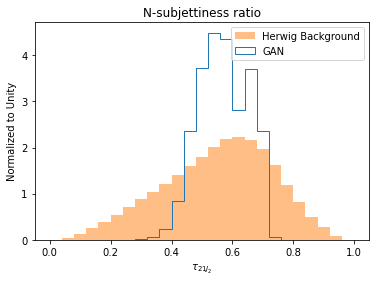

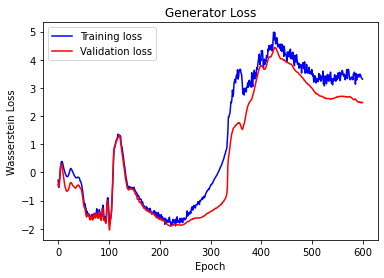

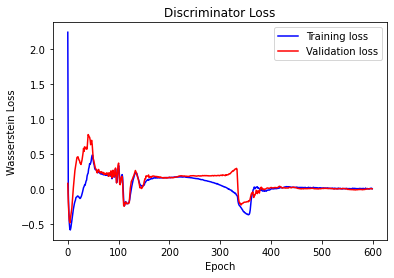

 61%|██████    | 610/1000 [2:05:22<1:22:43, 12.73s/it]
Epoch 610:

Generator training loss: 3.484482174851209
Discriminator training loss: 0.0061289642353834235

Generator validation loss: 2.410097116818194
Discriminator validation loss: 0.0014946000338404426
 62%|██████▏   | 619/1000 [2:07:14<1:18:11, 12.31s/it]
Epoch 620:

Generator training loss: 3.5987155330799987
Discriminator training loss: 0.004643325349271473

Generator validation loss: 2.435057139298956
Discriminator validation loss: 0.002039399722089822

Epoch 620:


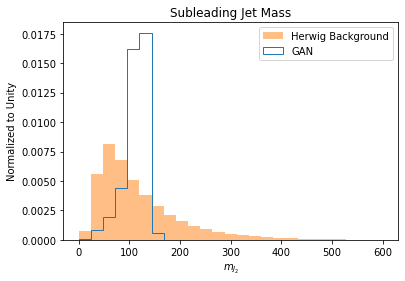

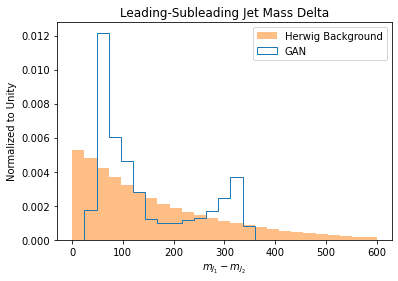

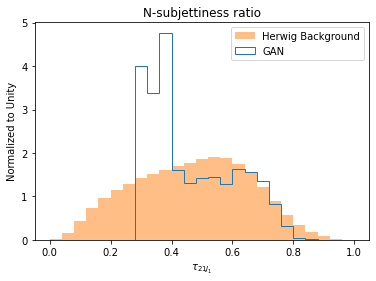

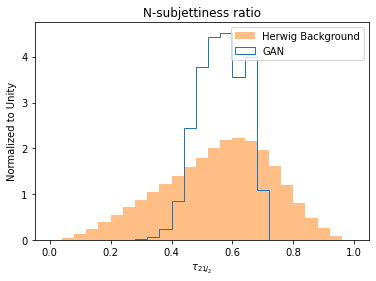

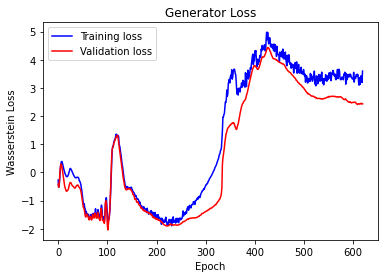

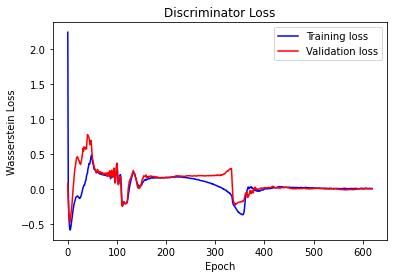

 63%|██████▎   | 630/1000 [2:09:33<1:16:17, 12.37s/it]
Epoch 630:

Generator training loss: 3.3844670787697937
Discriminator training loss: 0.005014274506755328

Generator validation loss: 2.428724258160984
Discriminator validation loss: 0.005578754668409813
 64%|██████▍   | 639/1000 [2:11:24<1:14:07, 12.32s/it]
Epoch 640:

Generator training loss: 3.635905852409005
Discriminator training loss: 0.006516137374534384

Generator validation loss: 2.410992288198625
Discriminator validation loss: 0.004513688568257763

Epoch 640:


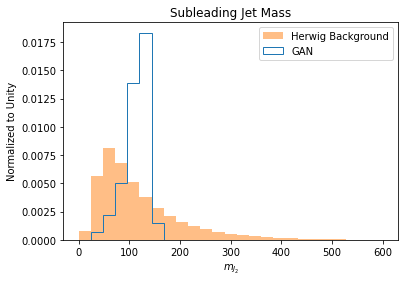

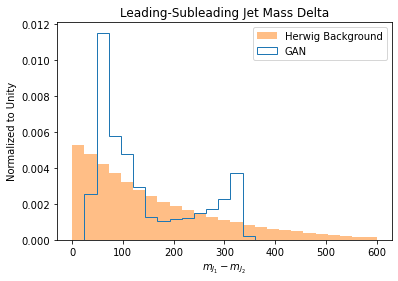

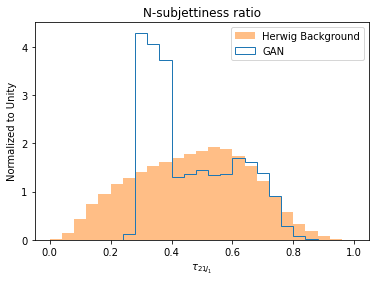

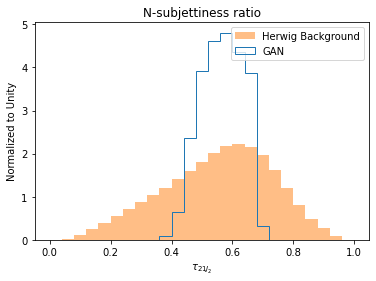

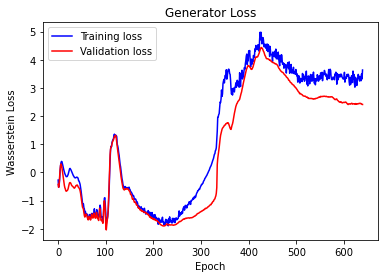

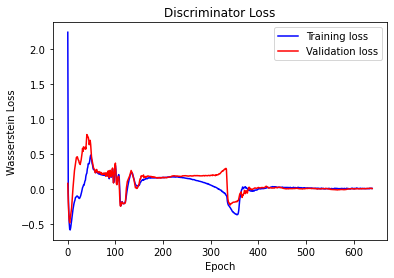

 65%|██████▌   | 650/1000 [2:13:43<1:11:46, 12.30s/it]
Epoch 650:

Generator training loss: 3.2614856140046844
Discriminator training loss: 0.00044639480420598996

Generator validation loss: 2.3954119755596373
Discriminator validation loss: 0.01082220241521852
 66%|██████▌   | 659/1000 [2:15:33<1:09:55, 12.30s/it]
Epoch 660:

Generator training loss: 3.31263072259439
Discriminator training loss: 0.003577774383796823

Generator validation loss: 2.385375443540636
Discriminator validation loss: 0.013111842907425734

Epoch 660:


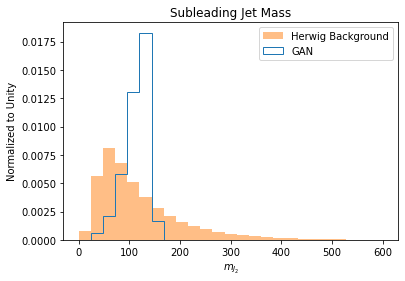

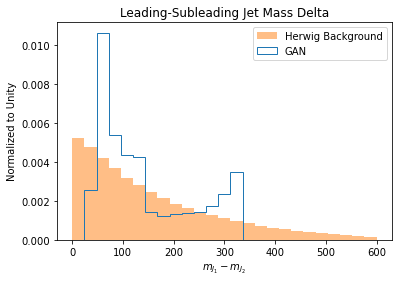

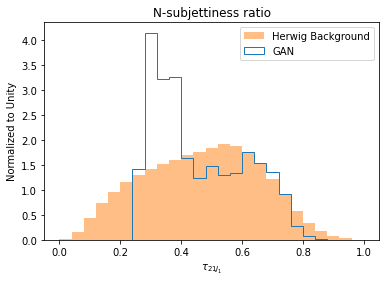

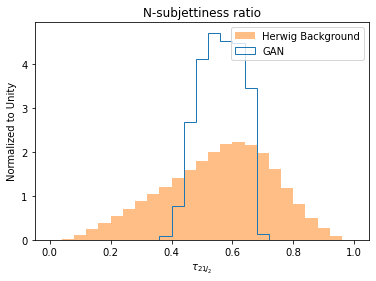

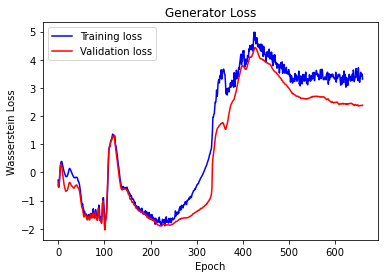

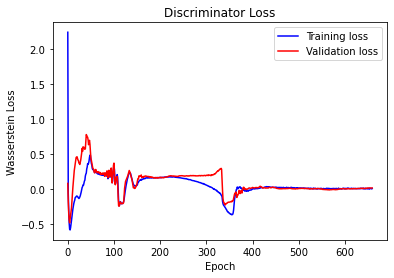

 67%|██████▋   | 670/1000 [2:17:52<1:07:43, 12.31s/it]
Epoch 670:

Generator training loss: 3.5768288650799334
Discriminator training loss: 0.006103316167758122

Generator validation loss: 2.485821856094186
Discriminator validation loss: 0.015403178401431407
 68%|██████▊   | 679/1000 [2:19:43<1:05:44, 12.29s/it]
Epoch 680:

Generator training loss: 3.6957931437127574
Discriminator training loss: 0.005129548581728562

Generator validation loss: 2.490768676898519
Discriminator validation loss: 0.017150604600918416

Epoch 680:


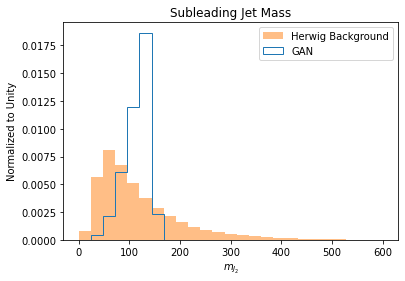

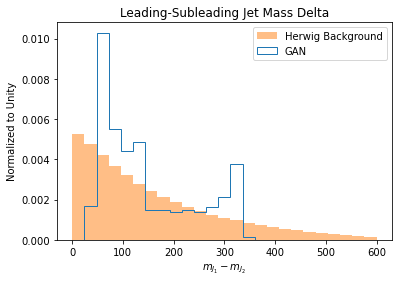

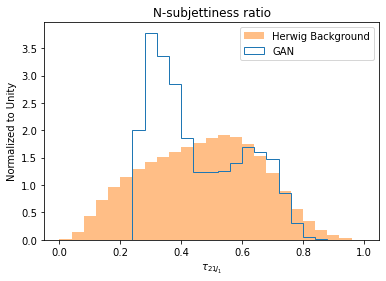

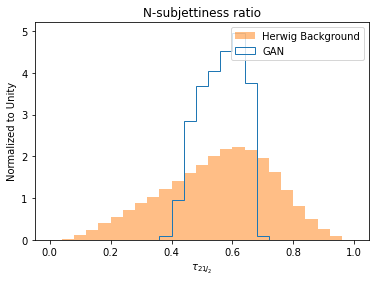

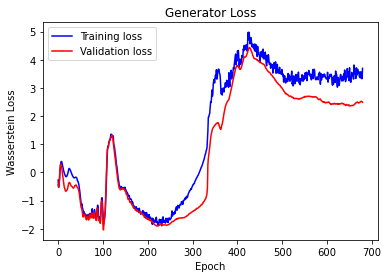

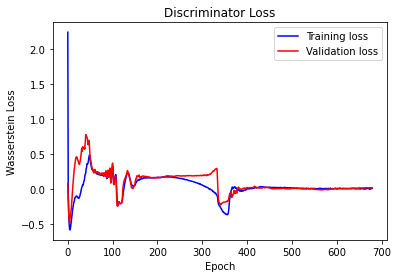

 69%|██████▉   | 690/1000 [2:22:04<1:04:22, 12.46s/it]
Epoch 690:

Generator training loss: 3.4102078991346705
Discriminator training loss: 0.0023509906654436068

Generator validation loss: 2.610111197487251
Discriminator validation loss: 0.022059606247940317
 70%|██████▉   | 699/1000 [2:23:55<1:01:31, 12.26s/it]
Epoch 700:

Generator training loss: 3.4820307555094456
Discriminator training loss: 0.007217385297437536

Generator validation loss: 2.576766346810294
Discriminator validation loss: 0.027090660583601916

Epoch 700:


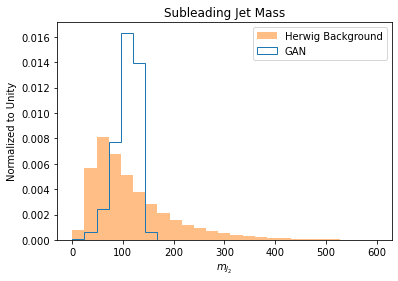

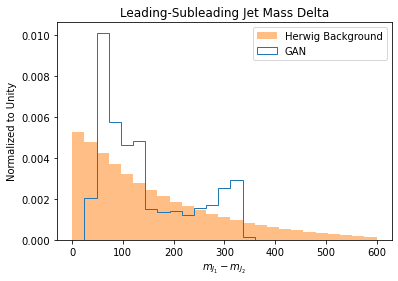

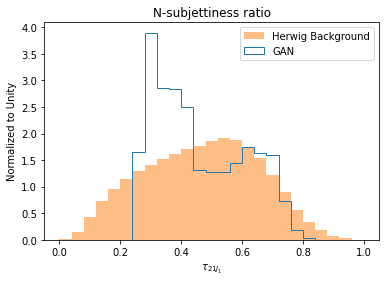

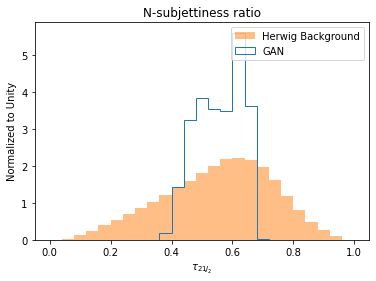

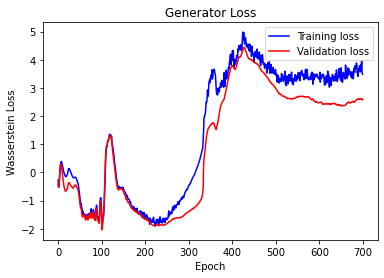

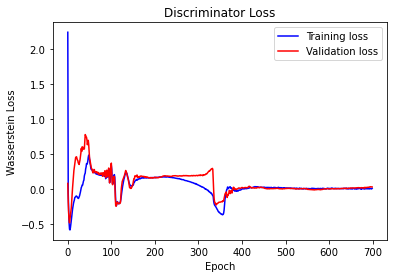

 71%|███████   | 710/1000 [2:26:16<1:00:07, 12.44s/it]
Epoch 710:

Generator training loss: 3.8394290363527994
Discriminator training loss: -0.0021895910412454167

Generator validation loss: 2.671831336422046
Discriminator validation loss: 0.022526942693819687
 72%|███████▏  | 719/1000 [2:28:08<58:22, 12.47s/it]
Epoch 720:

Generator training loss: 3.9400369136548394
Discriminator training loss: 0.0027455224292411828

Generator validation loss: 2.7386905492329183
Discriminator validation loss: 0.019072238745854404

Epoch 720:


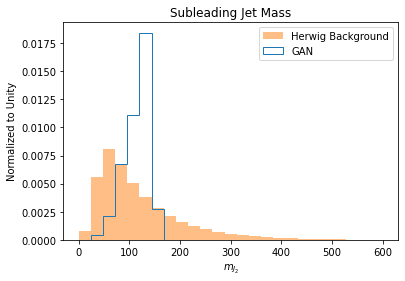

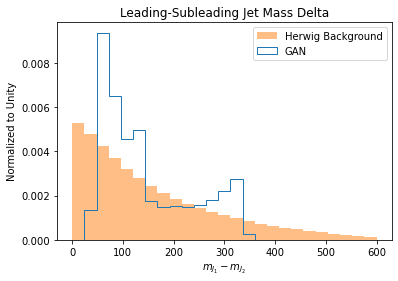

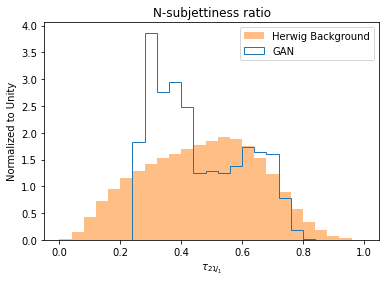

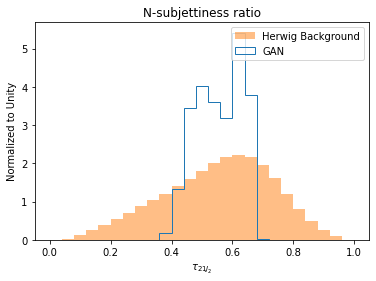

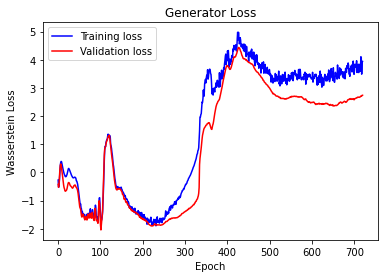

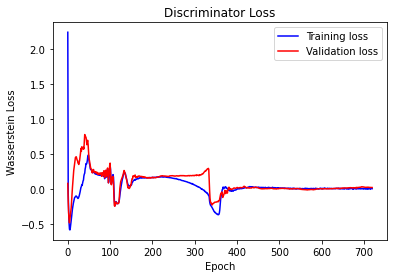

 73%|███████▎  | 730/1000 [2:30:32<58:03, 12.90s/it]  
Epoch 730:

Generator training loss: 3.7238507872559357
Discriminator training loss: 0.00102207542056911

Generator validation loss: 2.73021715903868
Discriminator validation loss: 0.021501909595469056
 74%|███████▍  | 739/1000 [2:32:18<50:55, 11.71s/it]
Epoch 740:

Generator training loss: 4.080266847880813
Discriminator training loss: 0.004534686867380686

Generator validation loss: 2.7203106205971497
Discriminator validation loss: 0.025314339072077106

Epoch 740:


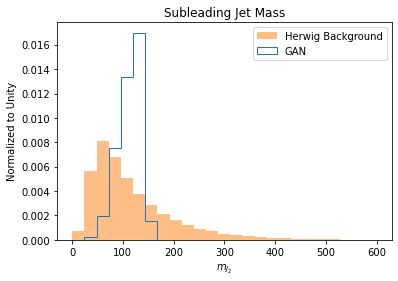

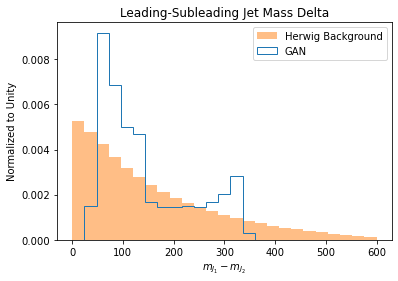

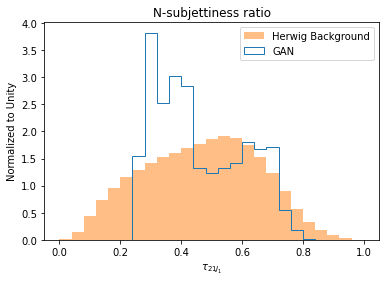

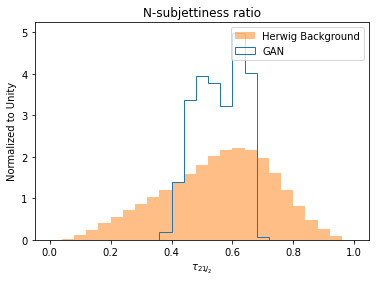

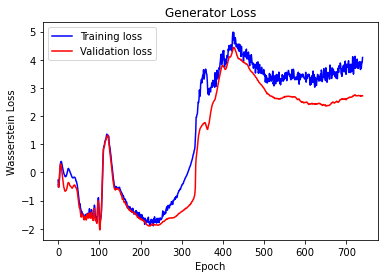

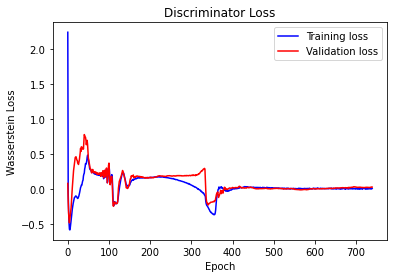

 75%|███████▌  | 750/1000 [2:34:29<48:17, 11.59s/it]
Epoch 750:

Generator training loss: 3.9804359680153594
Discriminator training loss: -0.002084890642923273

Generator validation loss: 2.718587584182865
Discriminator validation loss: 0.024316523627215342
 76%|███████▌  | 759/1000 [2:36:14<47:10, 11.75s/it]
Epoch 760:

Generator training loss: 3.7487837863587283
Discriminator training loss: 0.00894453775617876

Generator validation loss: 2.71510597306197
Discriminator validation loss: 0.02522287620269679

Epoch 760:


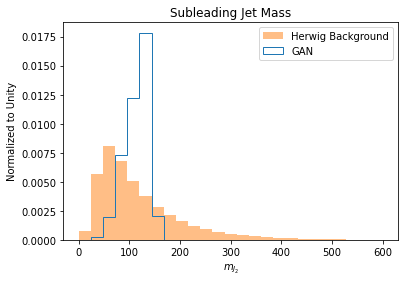

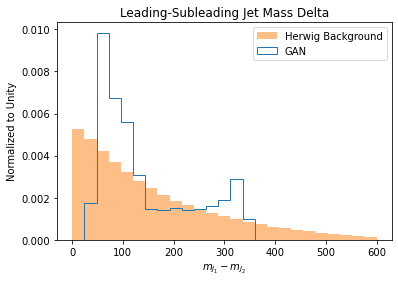

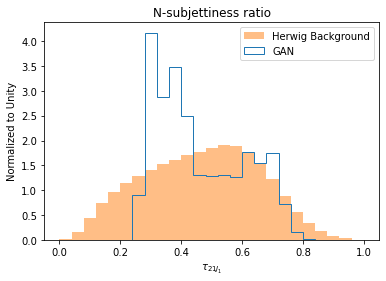

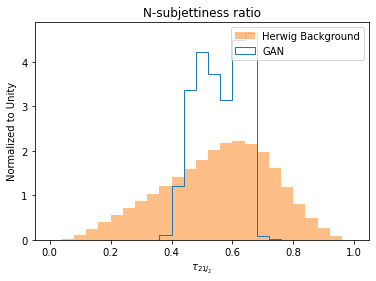

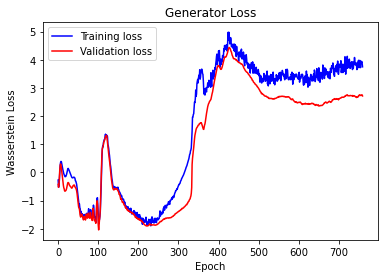

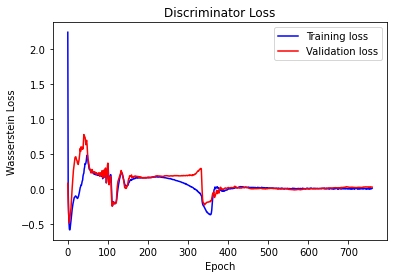

 77%|███████▋  | 770/1000 [2:38:27<45:28, 11.86s/it]
Epoch 770:

Generator training loss: 4.013904319679149
Discriminator training loss: -0.0011132033866483222

Generator validation loss: 2.7750831541956464
Discriminator validation loss: 0.025339215704393514
 78%|███████▊  | 779/1000 [2:40:12<42:23, 11.51s/it]
Epoch 780:

Generator training loss: 3.768767280493927
Discriminator training loss: 0.0001930332831553148

Generator validation loss: 2.7304021244654897
Discriminator validation loss: 0.019726107051938623

Epoch 780:


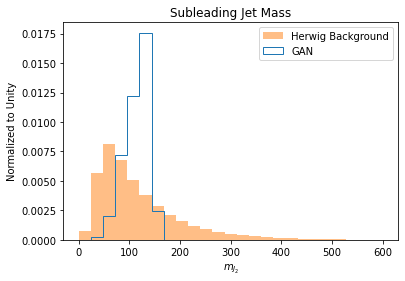

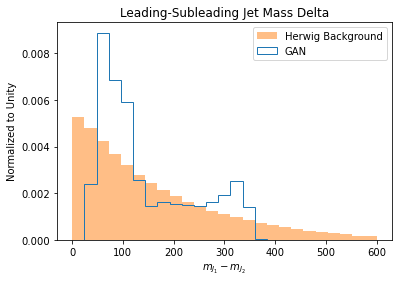

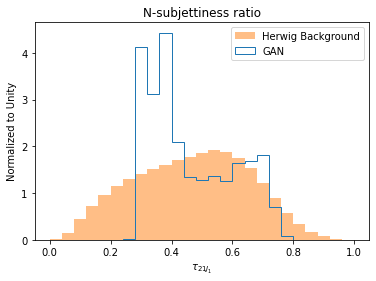

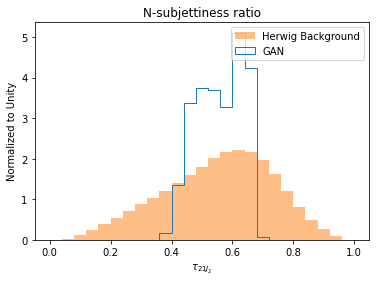

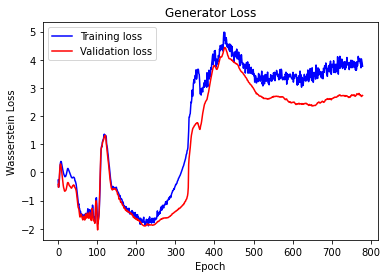

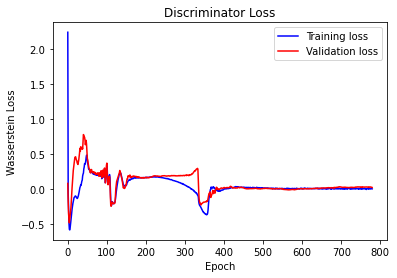

 79%|███████▉  | 790/1000 [2:42:23<40:52, 11.68s/it]
Epoch 790:

Generator training loss: 3.8203072556055266
Discriminator training loss: 0.0021112732544587677

Generator validation loss: 2.793510984934745
Discriminator validation loss: 0.019494600183131025
 80%|███████▉  | 799/1000 [2:44:07<38:27, 11.48s/it]
Epoch 800:

Generator training loss: 3.8848797191199016
Discriminator training loss: 0.0009387860329317702

Generator validation loss: 2.838644666994206
Discriminator validation loss: 0.0178851731312146

Epoch 800:


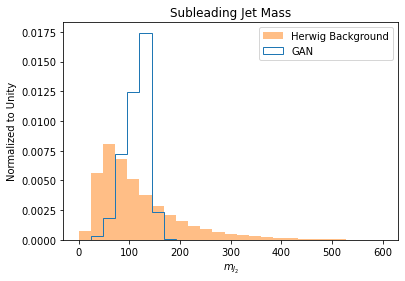

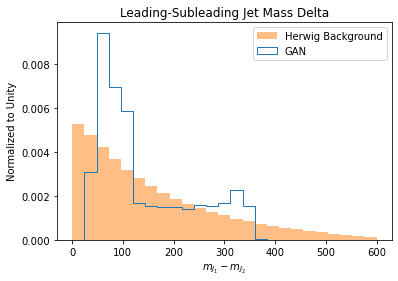

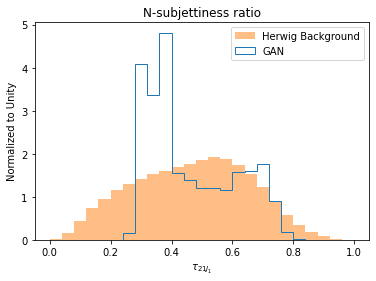

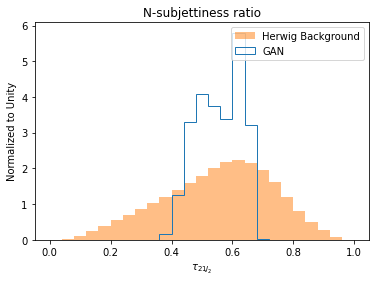

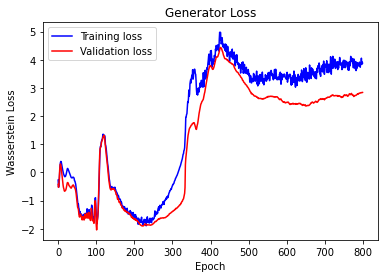

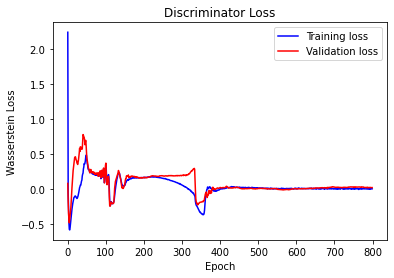

 81%|████████  | 810/1000 [2:46:18<36:48, 11.62s/it]
Epoch 810:

Generator training loss: 3.771712762084817
Discriminator training loss: 0.0003409253225176862

Generator validation loss: 2.846330095754297
Discriminator validation loss: 0.014244648201160174
 82%|████████▏ | 819/1000 [2:48:03<34:45, 11.52s/it]
Epoch 820:

Generator training loss: 3.8633584621988306
Discriminator training loss: 0.003967107396743082

Generator validation loss: 2.8189331896480976
Discriminator validation loss: 0.018720335759382072

Epoch 820:


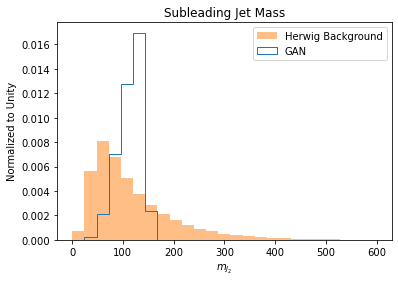

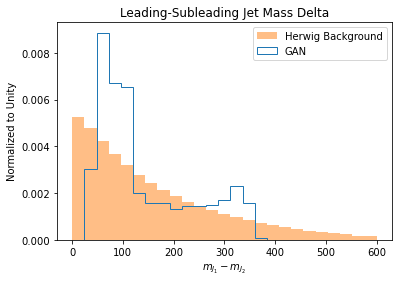

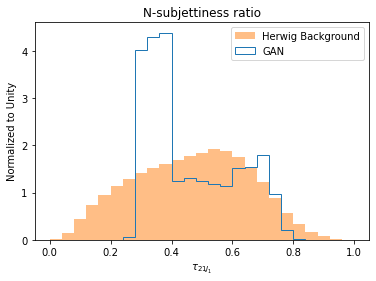

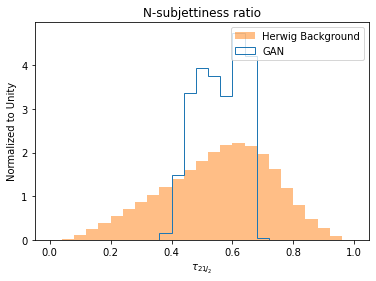

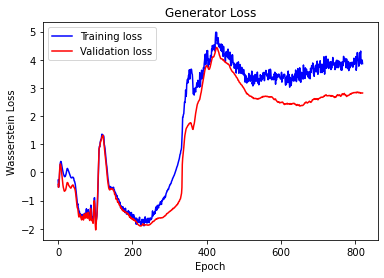

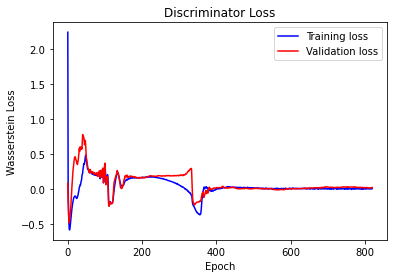

 83%|████████▎ | 830/1000 [2:50:14<32:37, 11.52s/it]
Epoch 830:

Generator training loss: 3.839956715377302
Discriminator training loss: 0.004408722052439414

Generator validation loss: 2.829627215617994
Discriminator validation loss: 0.012211942224372465
 84%|████████▍ | 839/1000 [2:51:59<31:21, 11.69s/it]
Epoch 840:

Generator training loss: 3.757453271355786
Discriminator training loss: 0.005949041131445565

Generator validation loss: 2.7952535399159433
Discriminator validation loss: 0.013716107206708678

Epoch 840:


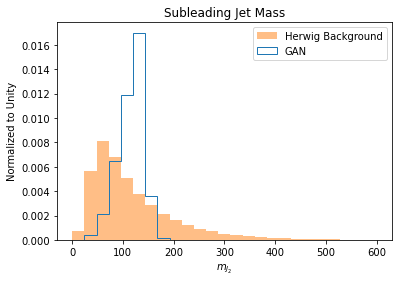

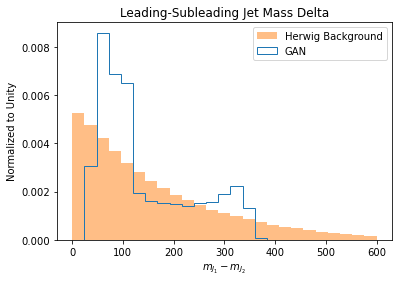

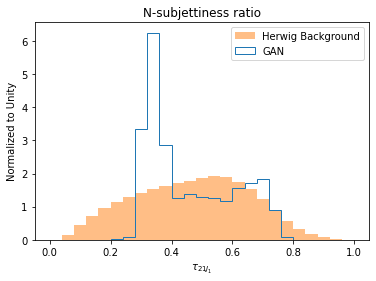

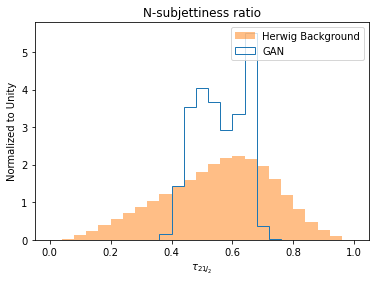

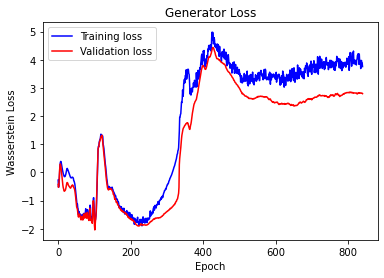

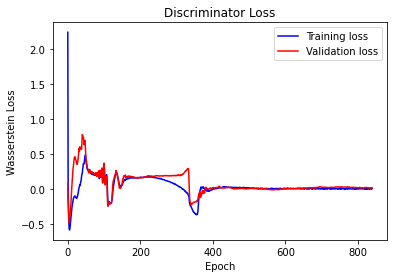

 85%|████████▌ | 850/1000 [2:54:11<29:07, 11.65s/it]
Epoch 850:

Generator training loss: 3.766350466045527
Discriminator training loss: -0.0007261976612336737

Generator validation loss: 2.822116640991853
Discriminator validation loss: 0.015777966136537265
 86%|████████▌ | 859/1000 [2:55:56<27:37, 11.76s/it]
Epoch 860:

Generator training loss: 3.984410684616837
Discriminator training loss: 9.257182878445718e-05

Generator validation loss: 2.8591012761729697
Discriminator validation loss: 0.008868341777915543

Epoch 860:


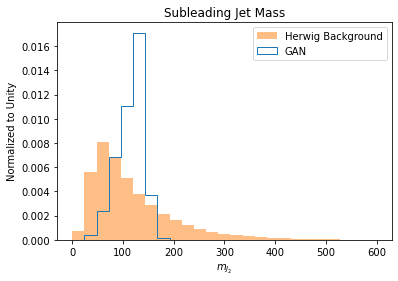

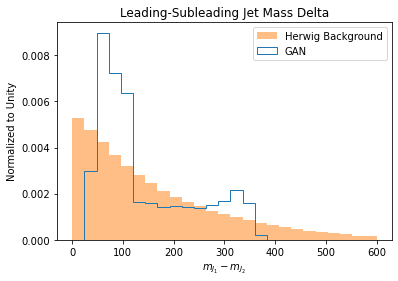

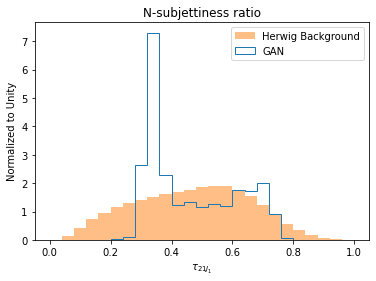

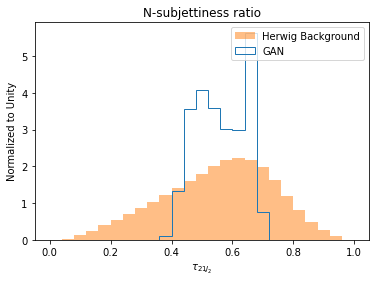

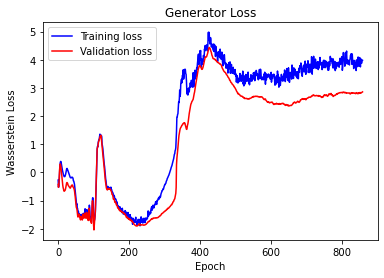

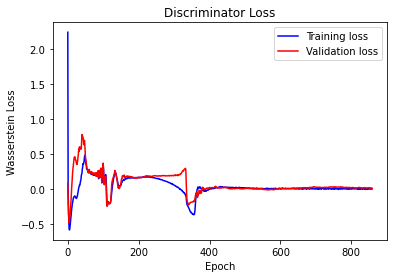

 87%|████████▋ | 870/1000 [2:58:20<27:08, 12.53s/it]
Epoch 870:

Generator training loss: 3.8772968304613262
Discriminator training loss: 0.0018312619379292515

Generator validation loss: 2.8244087588591644
Discriminator validation loss: 0.013335554448665386
 88%|████████▊ | 879/1000 [3:00:12<24:56, 12.37s/it]
Epoch 880:

Generator training loss: 4.112715741080016
Discriminator training loss: 0.0065800412165992125

Generator validation loss: 2.817836510109118
Discriminator validation loss: 0.010534242124590561

Epoch 880:


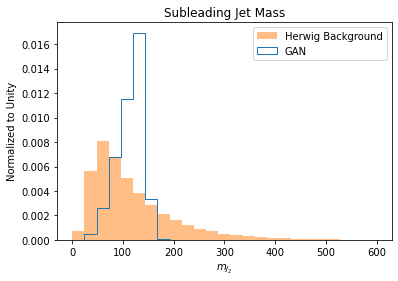

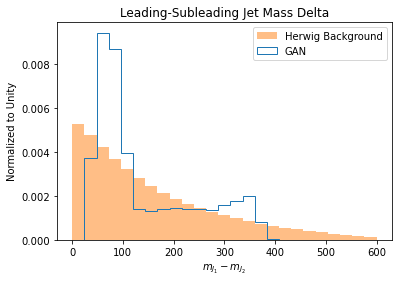

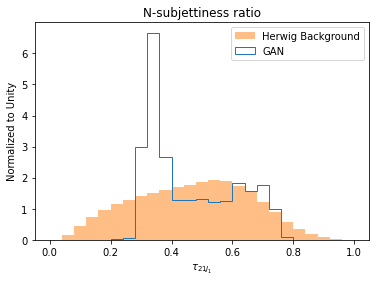

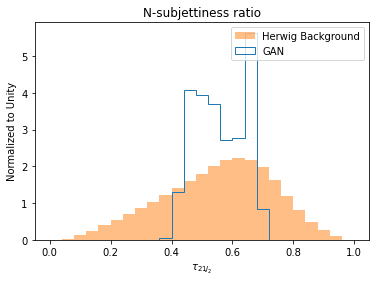

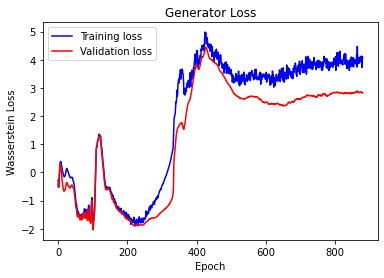

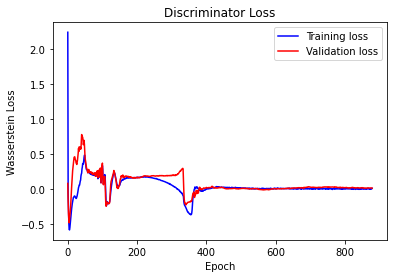

 89%|████████▉ | 890/1000 [3:02:35<23:14, 12.67s/it]
Epoch 890:

Generator training loss: 3.779595795550634
Discriminator training loss: -0.004223622964439683

Generator validation loss: 2.787470713990633
Discriminator validation loss: 0.013193682944802292
 90%|████████▉ | 899/1000 [3:04:29<21:10, 12.58s/it]
Epoch 900:

Generator training loss: 3.9640551984635892
Discriminator training loss: 0.0029317077487998654

Generator validation loss: 2.787960266480681
Discriminator validation loss: 0.01354026139623733

Epoch 900:


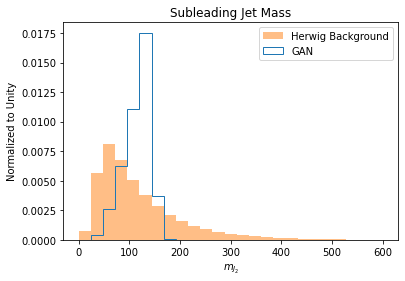

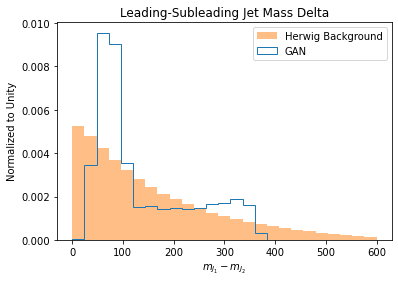

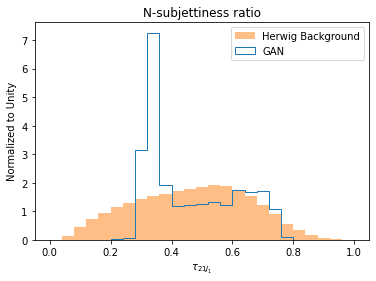

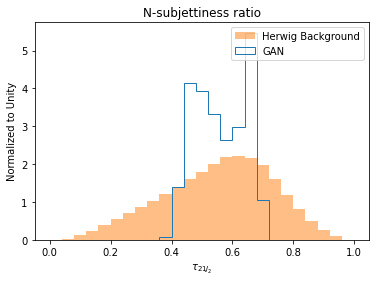

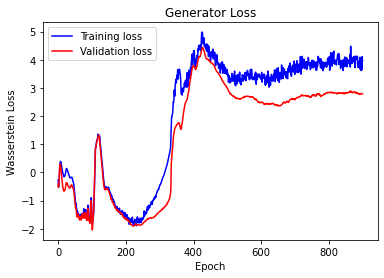

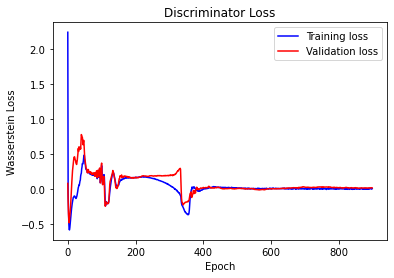

 91%|█████████ | 910/1000 [3:06:51<18:41, 12.46s/it]
Epoch 910:

Generator training loss: 4.123363776610851
Discriminator training loss: -0.005709542563979119

Generator validation loss: 2.729762107378148
Discriminator validation loss: 0.016949242453042433
 92%|█████████▏| 919/1000 [3:08:44<16:55, 12.53s/it]
Epoch 920:

Generator training loss: 3.8692807923249153
Discriminator training loss: 0.0029027267465145806

Generator validation loss: 2.7810234801202514
Discriminator validation loss: 0.009814826424514245

Epoch 920:


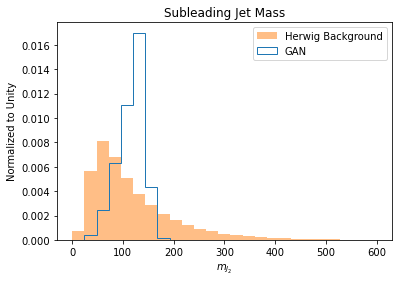

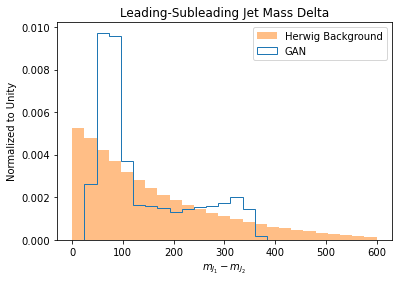

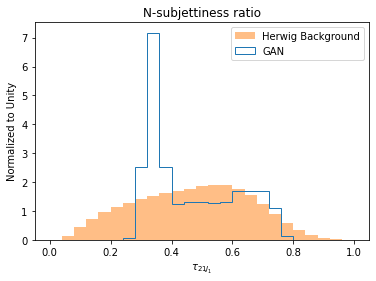

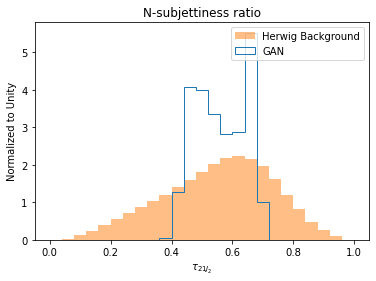

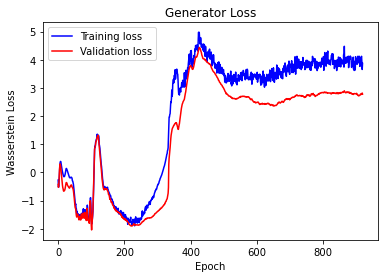

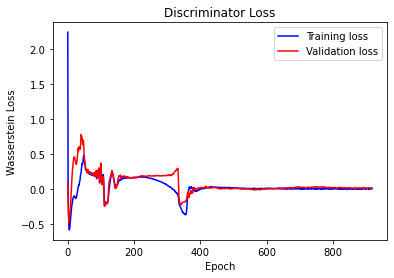

 93%|█████████▎| 930/1000 [3:11:07<14:36, 12.52s/it]
Epoch 930:

Generator training loss: 4.030857432653998
Discriminator training loss: -0.0003183380298659872

Generator validation loss: 2.7554412618523774
Discriminator validation loss: 0.014091391627867104
 94%|█████████▍| 939/1000 [3:13:00<12:40, 12.46s/it]
Epoch 940:

Generator training loss: 4.046116151689177
Discriminator training loss: -0.0004921521509580912

Generator validation loss: 2.74301406912139
Discriminator validation loss: 0.010527500026231882

Epoch 940:


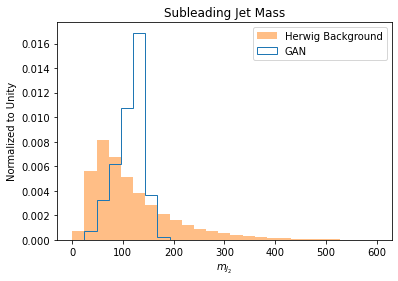

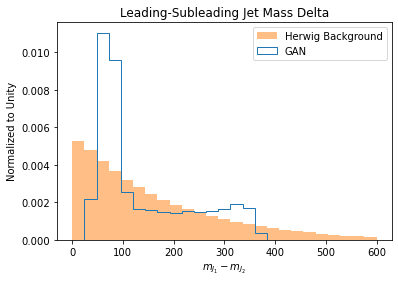

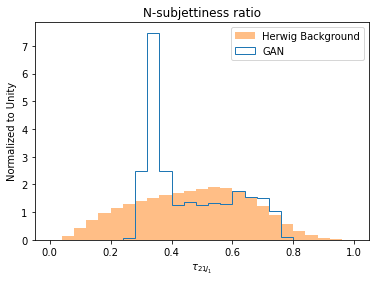

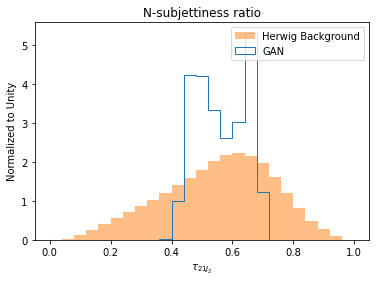

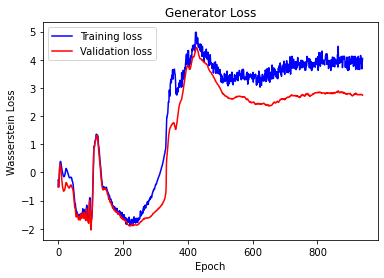

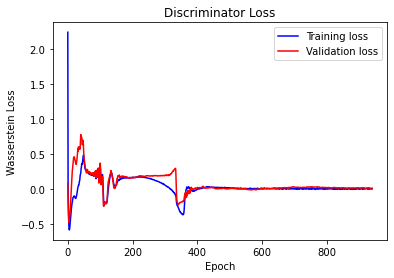

 95%|█████████▌| 950/1000 [3:15:22<10:33, 12.67s/it]
Epoch 950:

Generator training loss: 3.968782490068446
Discriminator training loss: 0.0018275816737166183

Generator validation loss: 2.720554140503291
Discriminator validation loss: 0.012285502124095937
 96%|█████████▌| 959/1000 [3:17:16<08:35, 12.58s/it]
Epoch 960:

Generator training loss: 4.209424678256606
Discriminator training loss: 0.007966270973941737

Generator validation loss: 2.8125668519833043
Discriminator validation loss: 0.014445971495504516

Epoch 960:


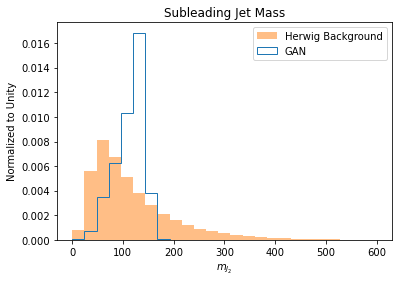

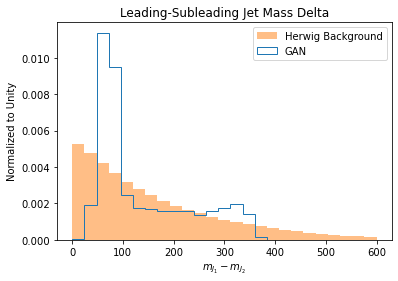

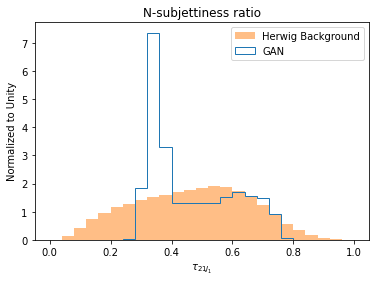

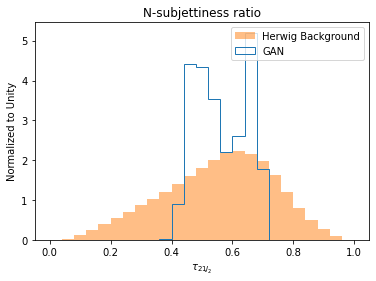

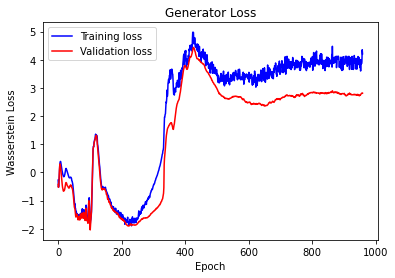

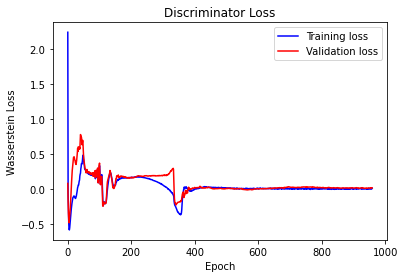

 97%|█████████▋| 970/1000 [3:19:39<06:16, 12.55s/it]
Epoch 970:

Generator training loss: 3.8674184793982986
Discriminator training loss: -0.002211848087372246

Generator validation loss: 2.8355379436836876
Discriminator validation loss: 0.01782958886526072
 98%|█████████▊| 979/1000 [3:21:34<04:27, 12.72s/it]
Epoch 980:

Generator training loss: 3.98041037425317
Discriminator training loss: 0.002245312266182499

Generator validation loss: 2.884199687936269
Discriminator validation loss: 0.015359240113523775

Epoch 980:


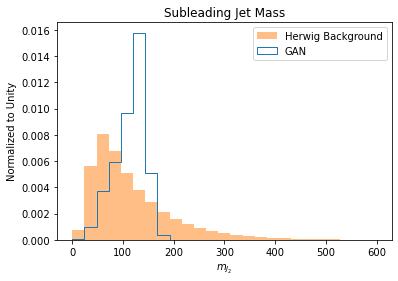

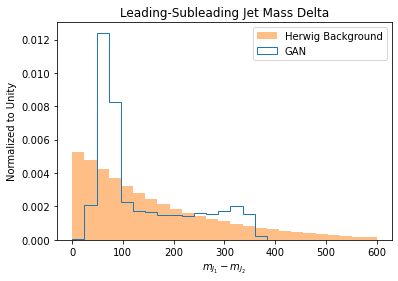

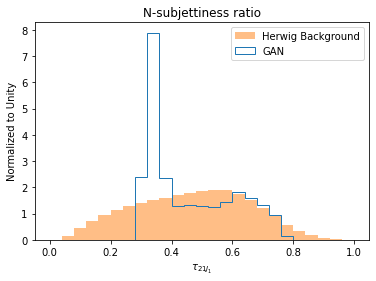

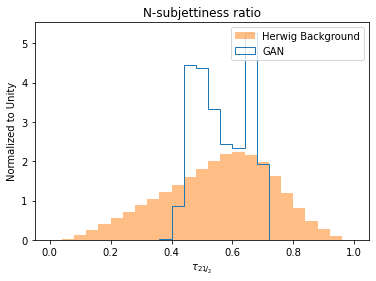

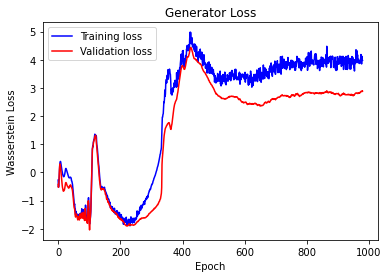

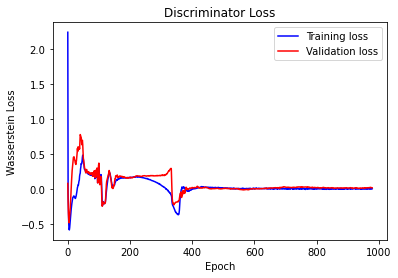

 99%|█████████▉| 990/1000 [3:23:53<02:04, 12.48s/it]
Epoch 990:

Generator training loss: 3.7931327086165965
Discriminator training loss: 0.005534870125557731

Generator validation loss: 2.842465068717472
Discriminator validation loss: 0.01537542495361032
100%|█████████▉| 999/1000 [3:25:39<00:11, 11.73s/it]
Epoch 1000:

Generator training loss: 3.8978176559906825
Discriminator training loss: 0.009469136956914705

Generator validation loss: 2.840168900909973
Discriminator validation loss: 0.0156467879476503

Epoch 1000:


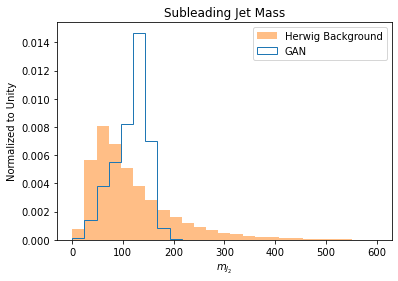

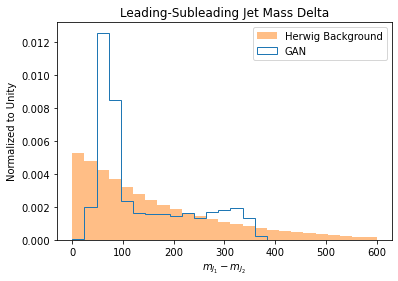

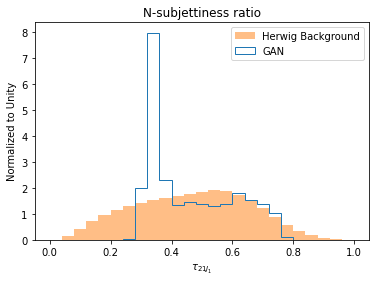

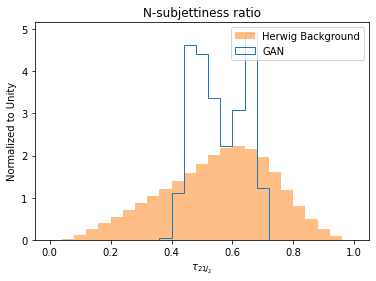

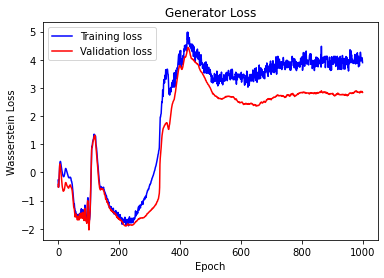

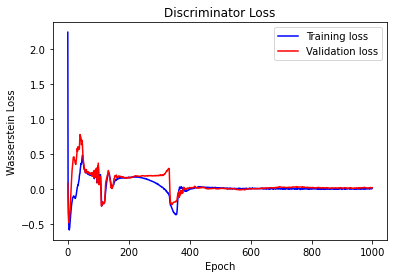

100%|██████████| 1000/1000 [3:25:56<00:00, 12.36s/it]


In [31]:
train(train_dataset, test_dataset, EPOCHS, N_CRITIC)

## Results
???